In [1]:
import json
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
import pandas as pd
import os
import csv
from tqdm import tqdm
import random
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
ROOT = '/home/lucyl/language-map-of-science/'
LOGS = ROOT + 'logs/'
DATA = ROOT + 'data/'

## Correlations and Relationships Among Variables

In [3]:
df = pd.read_parquet(LOGS + 'regression/some_variables/')

In [4]:
df

,paper id,citations,year bin,abstract length,num authors,num refs
0,94550757,"[7590511, 21050656]",1,133,7,0
1,94554780,"[205689340, 42923522, 93810868, 55768884]",1,80,2,0
2,94556483,[],0,153,3,0
3,94557639,[],0,182,9,0
4,94558598,[],1,69,1,0
...,...,...,...,...,...,...
5396564,21287420,[],2,205,3,0
5396565,111501198,[],2,106,2,0
5396566,111501355,[],1,89,1,0
5396567,111501641,[],1,97,1,0


In [5]:
with open(LOGS + 'regression/papers_to_regress.json', 'r') as infile:
    papers_left = json.load(infile)

In [6]:
paper_ids_set = set(df['paper id'].unique())
paper_year = dict(zip(df['paper id'], df['year bin']))

In [7]:
papers_to_regress = defaultdict(list)
for fos in papers_left: 
    paper_dicts = papers_left[fos]
    for paper in paper_dicts: 
        if paper['paper_id'] in paper_ids_set: 
            papers_to_regress[fos].append(paper)

In [8]:
# check that there are enough paper IDs for each fos and year bin
for fos in papers_to_regress: 
    years = [paper_year[d['paper_id']] for d in papers_to_regress[fos]]
    year_buckets = Counter(years)
    print(fos, len(papers_to_regress[fos]))
    print(year_buckets)
    print()

art 68230
Counter({1: 27518, 2: 25376, 0: 15336})

philosophy 68517
Counter({1: 28113, 2: 25553, 0: 14851})

economics 454441
Counter({2: 211596, 1: 161698, 0: 81147})

psychology 261105
Counter({2: 117124, 1: 89139, 0: 54842})

engineering 786828
Counter({2: 369506, 1: 283945, 0: 133377})

sociology 149495
Counter({2: 65434, 1: 53722, 0: 30339})

business 160711
Counter({2: 75263, 1: 58269, 0: 27179})

computer science 556414
Counter({2: 257203, 1: 210217, 0: 88994})

history 47919
Counter({2: 18613, 1: 17824, 0: 11482})

geography 127570
Counter({2: 58739, 1: 43507, 0: 25324})

biology 824785
Counter({2: 350093, 1: 276437, 0: 198255})

political science 45020
Counter({2: 19240, 1: 16983, 0: 8797})

medicine 1137940
Counter({2: 520093, 1: 375230, 0: 242617})

mathematics 363394
Counter({2: 156887, 1: 130131, 0: 76376})

environmental science 137867
Counter({2: 66006, 1: 47127, 0: 24734})

materials science 149603
Counter({2: 70422, 1: 50172, 0: 29009})

geology 343261
Counter({2: 1520

In [9]:
# include journal's average citations per year for paper
journal_citation_path = LOGS + 'regression/journal_citations/'
all_journal_cites = defaultdict(list)
for f in tqdm(os.listdir(journal_citation_path)): 
    with open(os.path.join(journal_citation_path, f), 'r') as infile: 
        d = json.load(infile)
    for journal in d: 
        all_journal_cites[journal].extend(d[journal])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:07<00:00, 14.03it/s]


In [10]:
journal_cite_avg = Counter()
for journal in all_journal_cites: 
    cite_count_list = np.array(all_journal_cites[journal])
    journal_cite_avg[journal] = np.mean(cite_count_list)

In [11]:
with open(LOGS + 'regression/papers_to_journals.json', 'r') as infile: 
    paper_journal = json.load(infile)

In [12]:
paper_avg_citations = {} 
for paper in paper_ids_set: 
    journal = paper_journal[paper]
    avg_cite = journal_cite_avg[journal]
    paper_avg_citations[paper] = avg_cite
df['journal avg cite'] = df['paper id'].apply(lambda x: paper_avg_citations.get(x))
df

,paper id,citations,year bin,abstract length,num authors,num refs,journal avg cite
0,94550757,"[7590511, 21050656]",1,133,7,0,2.052923
1,94554780,"[205689340, 42923522, 93810868, 55768884]",1,80,2,0,10.639529
2,94556483,[],0,153,3,0,0.597869
3,94557639,[],0,182,9,0,1.271349
4,94558598,[],1,69,1,0,0.685690
...,...,...,...,...,...,...,...
5396564,21287420,[],2,205,3,0,2.446298
5396565,111501198,[],2,106,2,0,0.295649
5396566,111501355,[],1,89,1,0,0.264748
5396567,111501641,[],1,97,1,0,0.065007


In [13]:
df['num citations'] = df['citations'].apply(len)
var_df = df.drop(columns=['citations'])
var_df

,paper id,year bin,abstract length,num authors,num refs,journal avg cite,num citations
0,94550757,1,133,7,0,2.052923,2
1,94554780,1,80,2,0,10.639529,4
2,94556483,0,153,3,0,0.597869,0
3,94557639,0,182,9,0,1.271349,0
4,94558598,1,69,1,0,0.685690,0
...,...,...,...,...,...,...,...
5396564,21287420,2,205,3,0,2.446298,0
5396565,111501198,2,106,2,0,0.295649,0
5396566,111501355,1,89,1,0,0.264748,0
5396567,111501641,1,97,1,0,0.065007,0


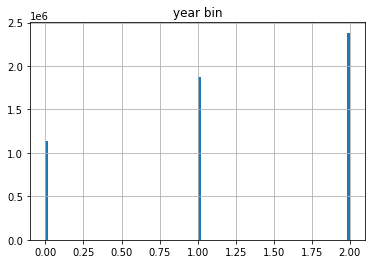

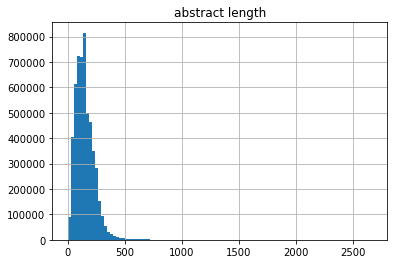

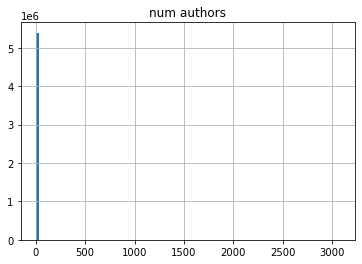

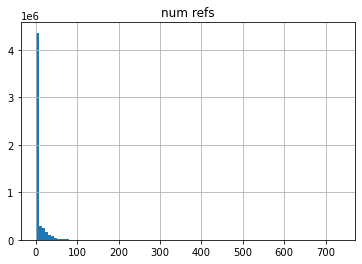

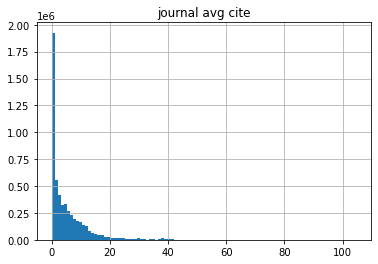

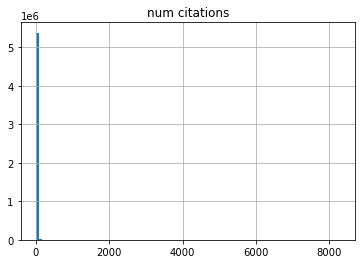

In [14]:
# plot distributions of each variable
for col in var_df.columns: 
    if col == 'paper id': continue
    var_df.hist(column=col, bins=100)
    plt.title(col)
    plt.show()

In [15]:
var_df_transformed = var_df.copy()
var_df_transformed['log num authors'] = np.log10(var_df_transformed['num authors'] + 1)
var_df_transformed['log num refs'] = np.log10(var_df_transformed['num refs'] + 1)
var_df_transformed['log num citations'] = np.log10(var_df_transformed['num citations'] + 1)
var_df_transformed = var_df_transformed.drop(columns=['num authors', 'num refs'])
var_df_transformed

,paper id,year bin,abstract length,journal avg cite,num citations,log num authors,log num refs,log num citations
0,94550757,1,133,2.052923,2,0.903090,0.0,0.477121
1,94554780,1,80,10.639529,4,0.477121,0.0,0.698970
2,94556483,0,153,0.597869,0,0.602060,0.0,0.000000
3,94557639,0,182,1.271349,0,1.000000,0.0,0.000000
4,94558598,1,69,0.685690,0,0.301030,0.0,0.000000
...,...,...,...,...,...,...,...,...
5396564,21287420,2,205,2.446298,0,0.602060,0.0,0.000000
5396565,111501198,2,106,0.295649,0,0.477121,0.0,0.000000
5396566,111501355,1,89,0.264748,0,0.301030,0.0,0.000000
5396567,111501641,1,97,0.065007,0,0.301030,0.0,0.000000


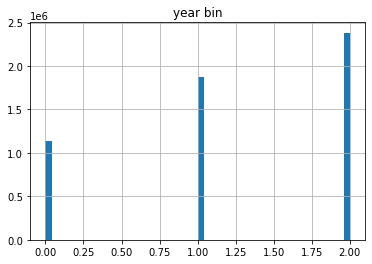

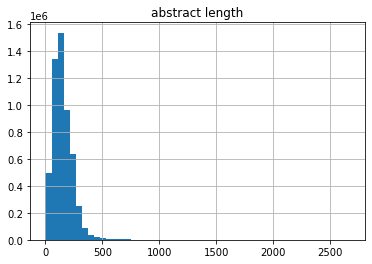

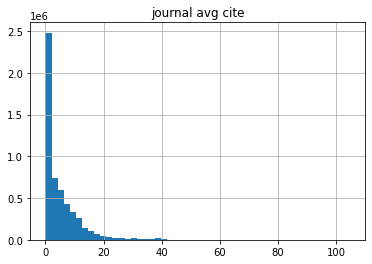

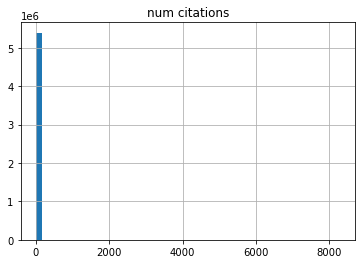

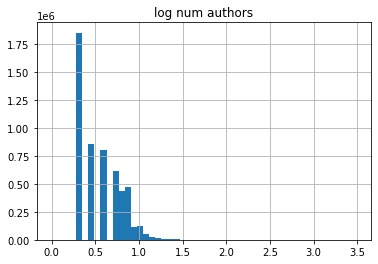

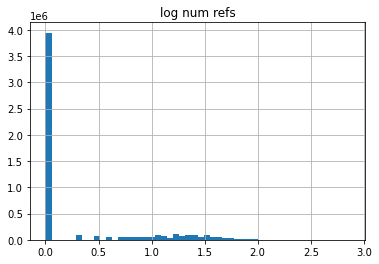

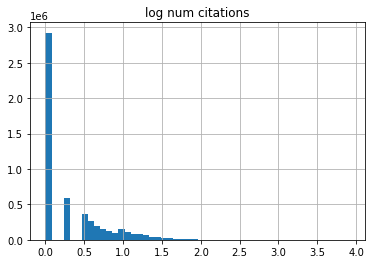

In [16]:
# plot distributions of each variable
for col in var_df_transformed.columns: 
    if col == 'paper id': continue
    var_df_transformed.hist(column=col, bins=50)
    plt.title(col)
    plt.show()

## Run citation regression

In [17]:
from statsmodels.discrete import truncated_model # TruncatedLFPoisson, TruncatedLFNegativeBinomialP
from patsy import dmatrices
import statsmodels.formula.api as smf
import statsmodels.api as sm
import scipy
import statsmodels.discrete.count_model as cm

In [18]:
jargon_scores_path = LOGS + 'regression_sample/paper_scores/0.1/'
sense_scores = defaultdict(dict) # {fos : {paper : score}}
type_scores = defaultdict(dict) # {fos : {paper : score}}
for f in tqdm(os.listdir(jargon_scores_path)): 
    with open(os.path.join(jargon_scores_path, f), 'r') as infile:
        d = json.load(infile)
    for paper_fos in d: 
        contents = paper_fos.split('@')
        paper_id = contents[0]
        fos = contents[1]
        scores = d[paper_fos]
        sense_scores[fos][paper_id] = scores['sense']
        type_scores[fos][paper_id] = scores['type']

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:18<00:00,  5.44it/s]


###########################
------- ART -------
###########################


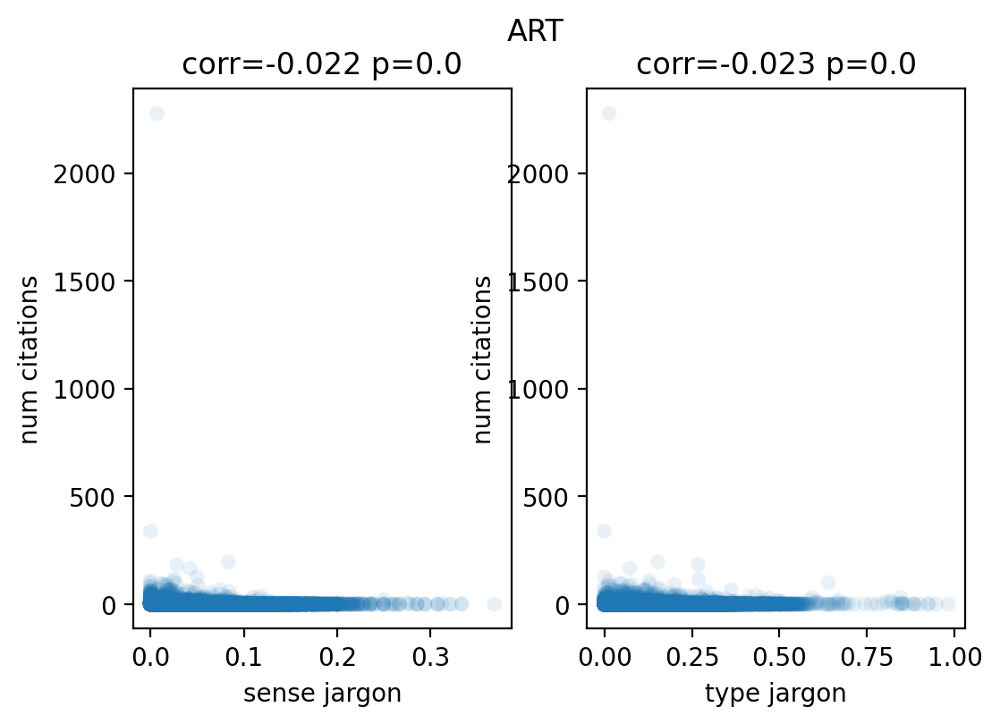

auxiliary OLS regression model parameters: lambda_param    16.034385
dtype: float64
t-value: lambda_param    0.421035
dtype: float64
t critical value: -2.3264025385491145

Overdispersion ratio: 99.37967597932754
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:                68220
Model:                            GLM   Df Residuals:                    68210
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -38612.
Date:                Mon, 05 Dec 2022   Deviance:                       13369.
Time:                        09:09:53   Pearson chi2:                 1.45e+05
No. Iterations:                    25   Pseudo R-squ. (CS):             0.1275
Covariance Type:            nonrobust                                        

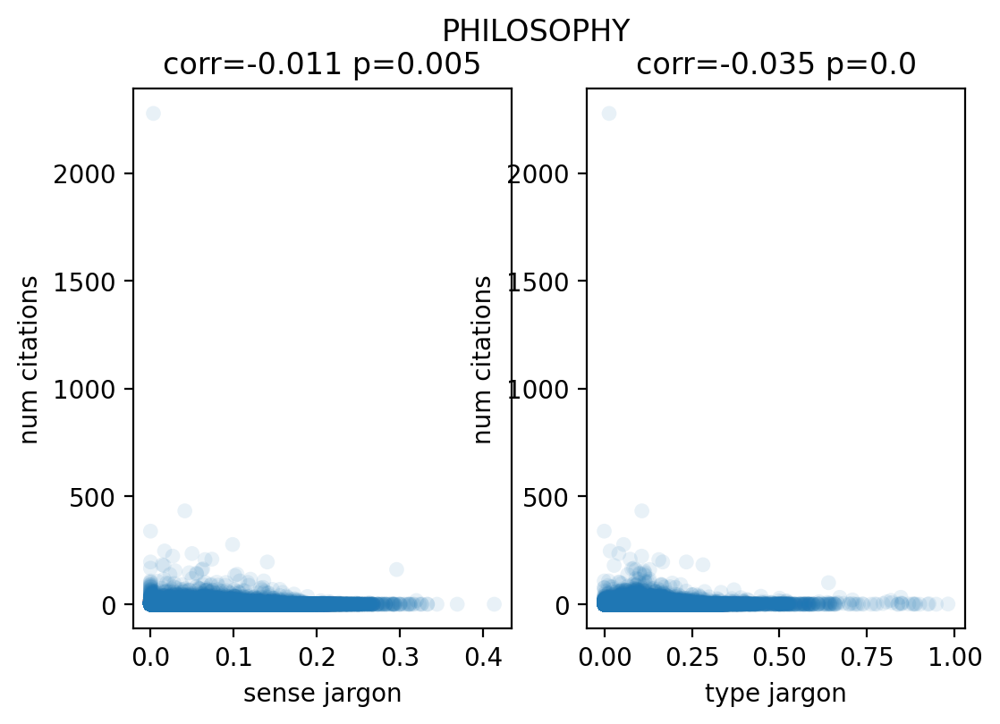

auxiliary OLS regression model parameters: lambda_param    6.530987
dtype: float64
t-value: lambda_param    0.57483
dtype: float64
t critical value: -2.3264023055588825

Overdispersion ratio: 62.902378630138344
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:                68512
Model:                            GLM   Df Residuals:                    68502
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -60217.
Date:                Mon, 05 Dec 2022   Deviance:                       26922.
Time:                        09:09:57   Pearson chi2:                 2.24e+05
No. Iterations:                    40   Pseudo R-squ. (CS):             0.2781
Covariance Type:            nonrobust                                         

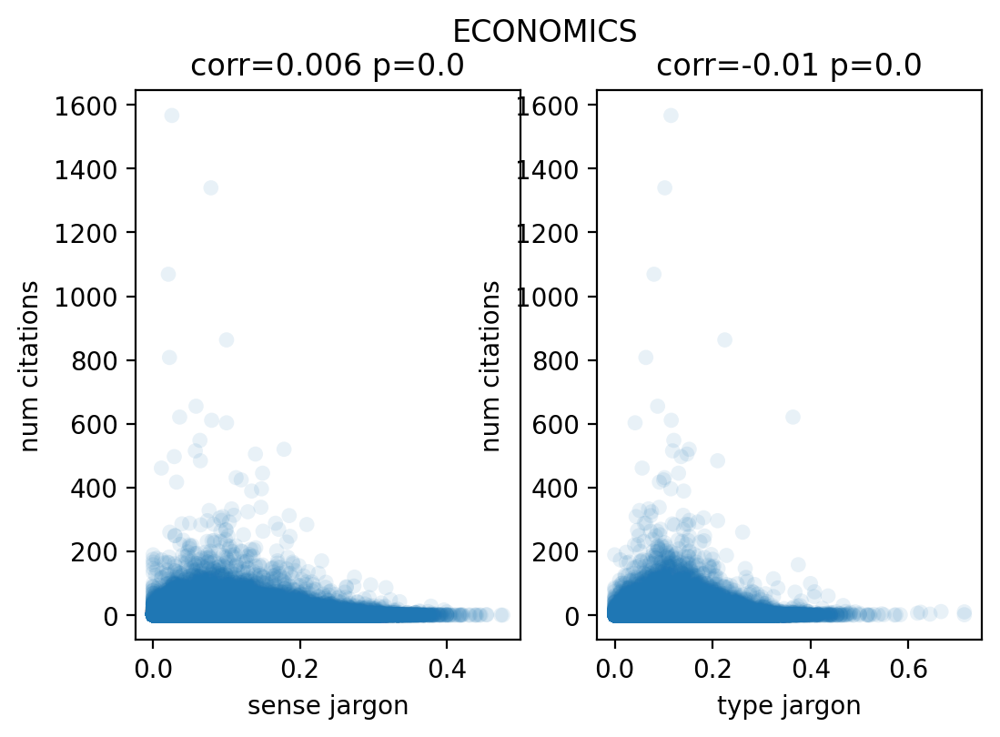

auxiliary OLS regression model parameters: lambda_param    2.401329
dtype: float64
t-value: lambda_param    11.29702
dtype: float64
t critical value: -2.326356084018599

Overdispersion ratio: 14.50815986877192
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               454215
Model:                            GLM   Df Residuals:                   454205
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.1797e+05
Date:                Mon, 05 Dec 2022   Deviance:                   3.6613e+05
Time:                        09:10:25   Pearson chi2:                 1.17e+06
No. Iterations:                    36   Pseudo R-squ. (CS):             0.4700
Covariance Type:            nonrobust                                         


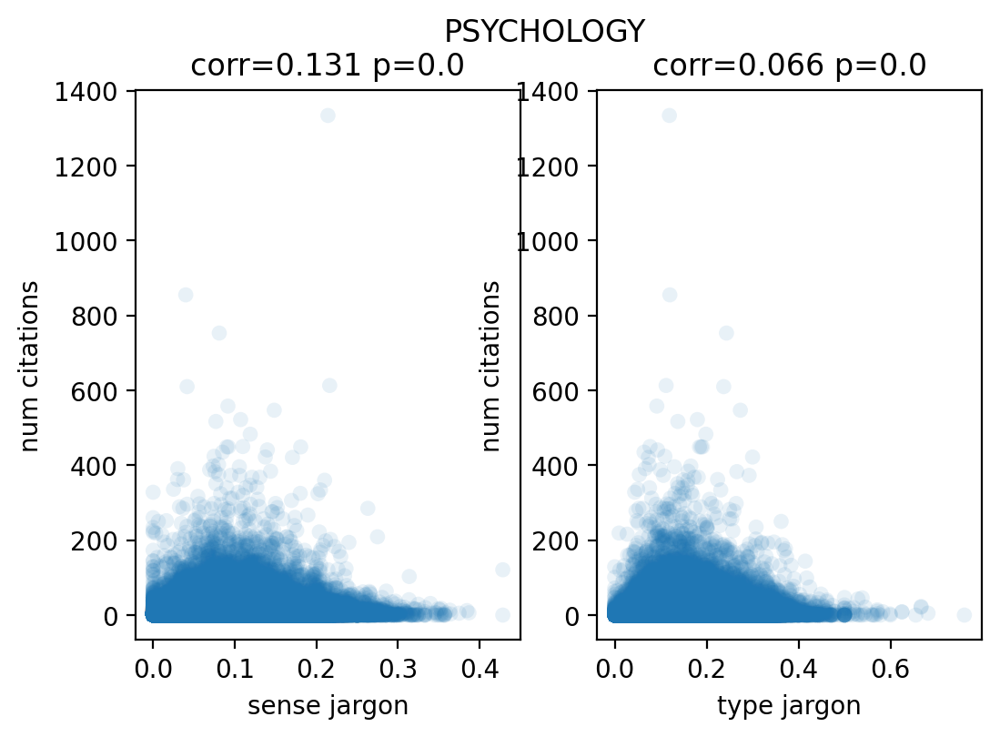

auxiliary OLS regression model parameters: lambda_param    1.548831
dtype: float64
t-value: lambda_param    30.131871
dtype: float64
t critical value: -2.32636215623873

Overdispersion ratio: 17.94389421445164
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               261102
Model:                            GLM   Df Residuals:                   261092
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.0730e+05
Date:                Mon, 05 Dec 2022   Deviance:                   2.9869e+05
Time:                        09:10:39   Pearson chi2:                 7.17e+05
No. Iterations:                    24   Pseudo R-squ. (CS):             0.5154
Covariance Type:            nonrobust                                         


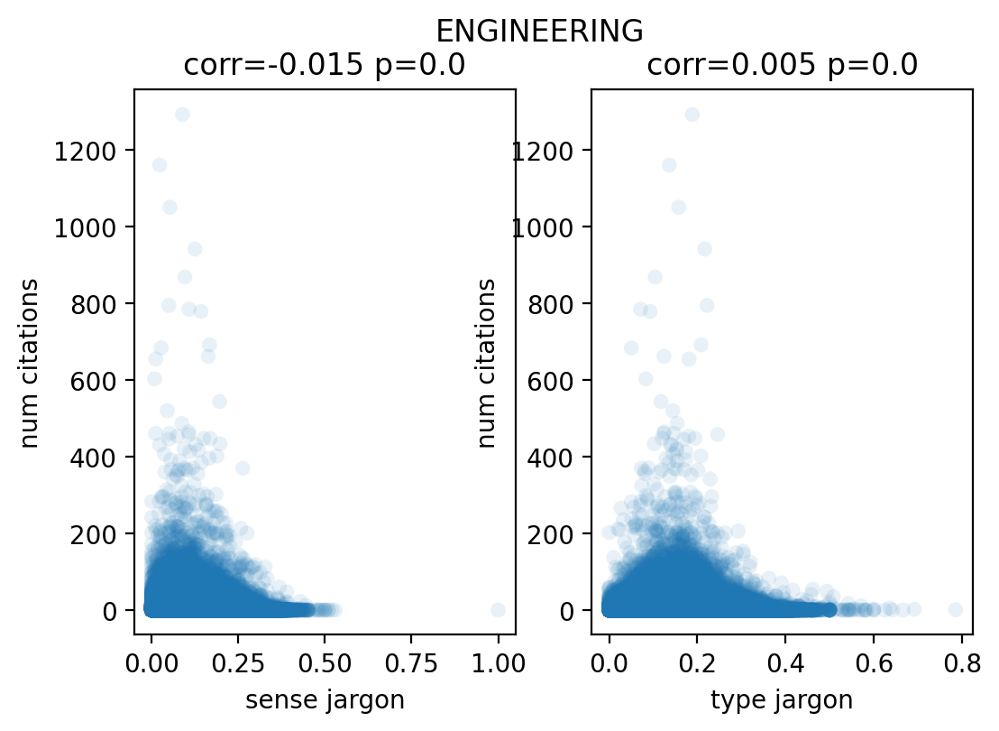

auxiliary OLS regression model parameters: lambda_param    1.546903
dtype: float64
t-value: lambda_param    4.416381
dtype: float64
t critical value: -2.3263526150536036

Overdispersion ratio: 16.736787847619368
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               786559
Model:                            GLM   Df Residuals:                   786549
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -9.8337e+05
Date:                Mon, 05 Dec 2022   Deviance:                   7.0071e+05
Time:                        09:11:23   Pearson chi2:                 4.45e+06
No. Iterations:                    31   Pseudo R-squ. (CS):             0.5908
Covariance Type:            nonrobust                                        

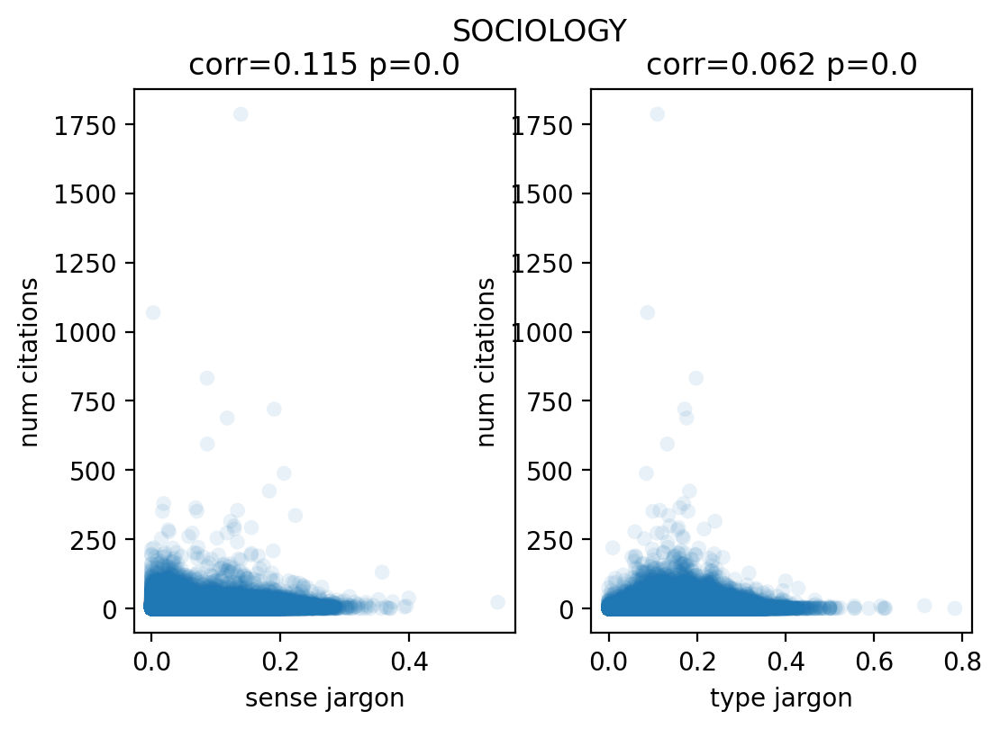

auxiliary OLS regression model parameters: lambda_param    2.351286
dtype: float64
t-value: lambda_param    8.540541
dtype: float64
t critical value: -2.326372820773971

Overdispersion ratio: 17.587346154658718
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               149484
Model:                            GLM   Df Residuals:                   149474
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.6516e+05
Date:                Mon, 05 Dec 2022   Deviance:                   1.3139e+05
Time:                        09:11:32   Pearson chi2:                 4.18e+05
No. Iterations:                    29   Pseudo R-squ. (CS):             0.4496
Covariance Type:            nonrobust                                         

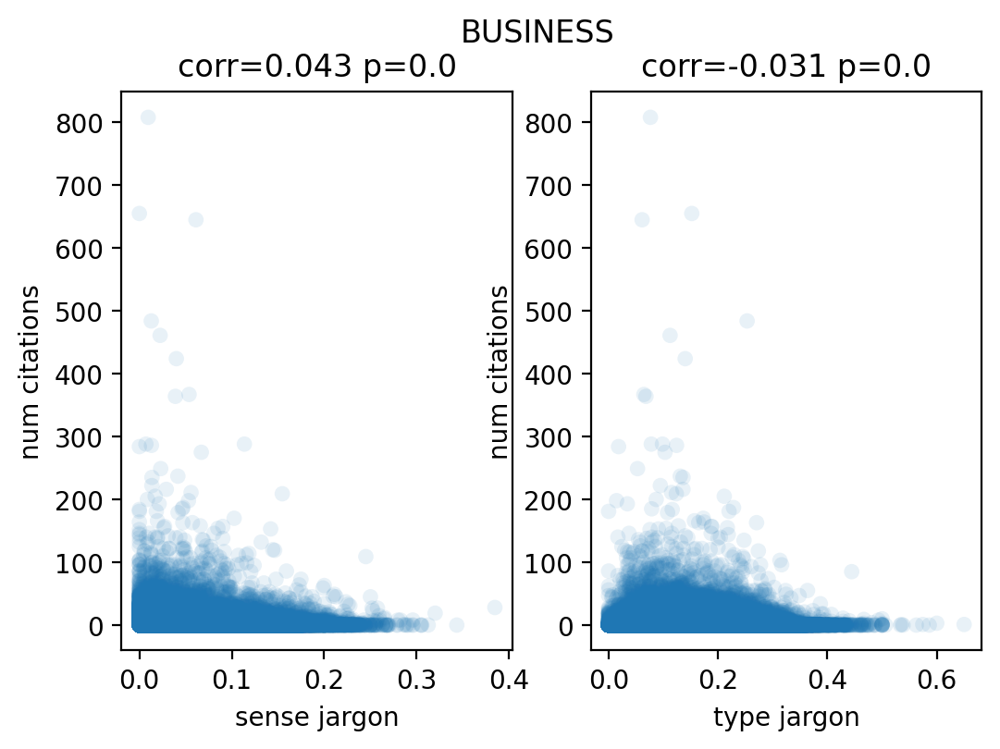

auxiliary OLS regression model parameters: lambda_param    1.92877
dtype: float64
t-value: lambda_param    16.039206
dtype: float64
t critical value: -2.3263711033047034

Overdispersion ratio: 11.75123115065439
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               160536
Model:                            GLM   Df Residuals:                   160526
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.0142e+05
Date:                Mon, 05 Dec 2022   Deviance:                   1.3763e+05
Time:                        09:11:41   Pearson chi2:                 3.93e+05
No. Iterations:                    38   Pseudo R-squ. (CS):             0.5331
Covariance Type:            nonrobust                                         

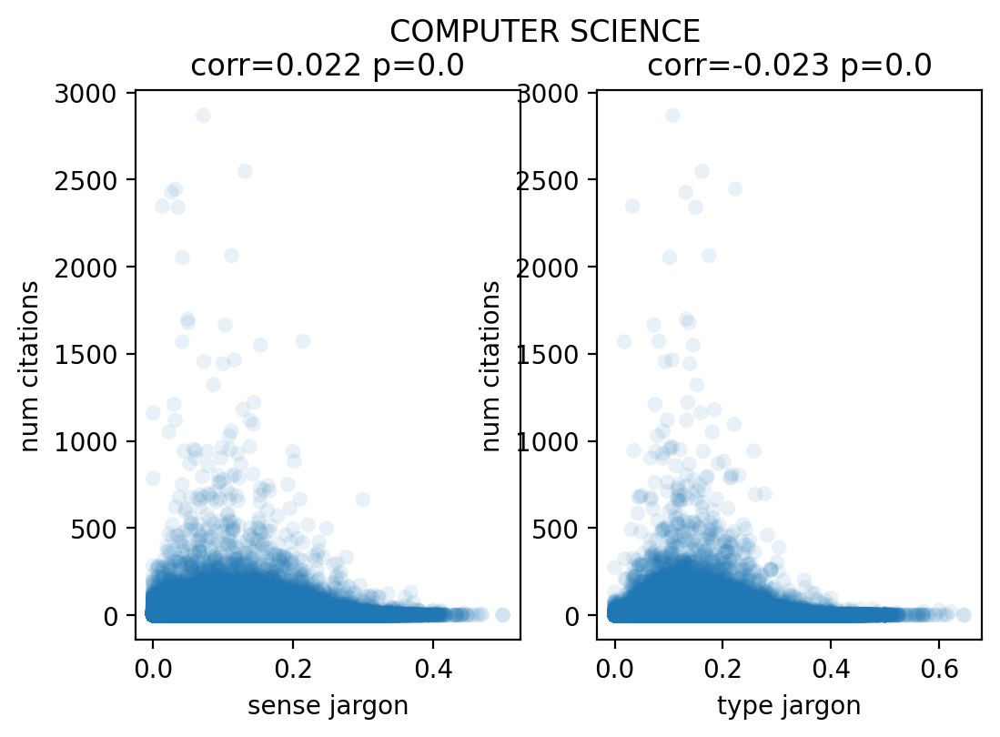

auxiliary OLS regression model parameters: lambda_param    4.283435
dtype: float64
t-value: lambda_param    9.930396
dtype: float64
t critical value: -2.3263545770610428

Overdispersion ratio: 42.03987380913659
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               556330
Model:                            GLM   Df Residuals:                   556320
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -9.6758e+05
Date:                Mon, 05 Dec 2022   Deviance:                   3.4135e+05
Time:                        09:12:11   Pearson chi2:                 2.64e+06
No. Iterations:                    34   Pseudo R-squ. (CS):             0.3467
Covariance Type:            nonrobust                                         

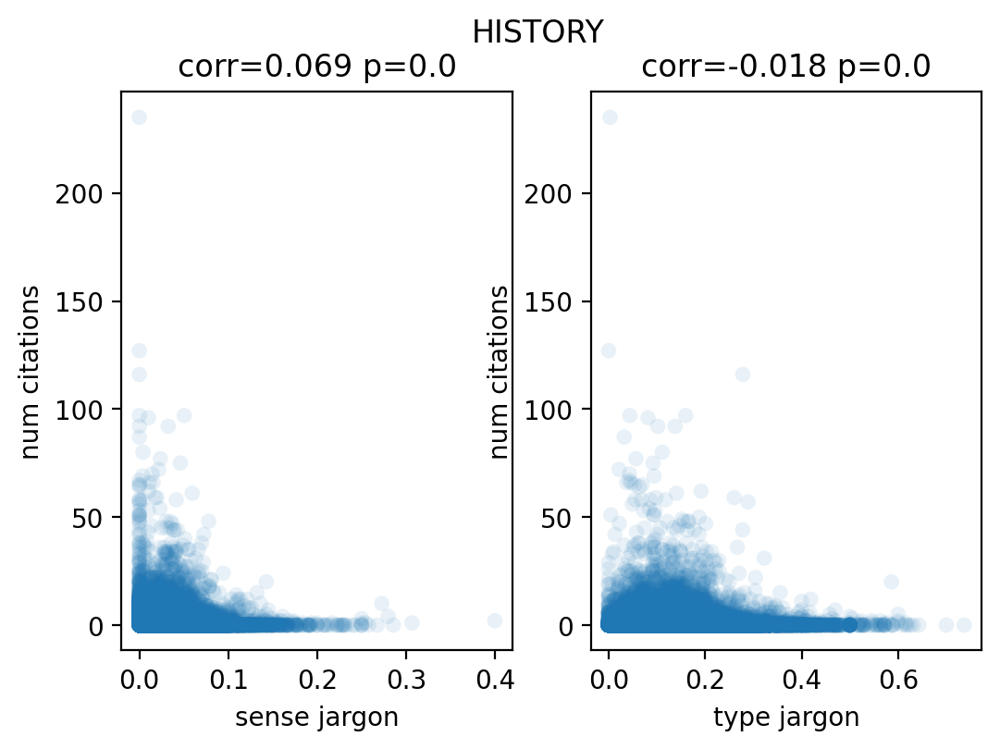

auxiliary OLS regression model parameters: lambda_param    1.989469
dtype: float64
t-value: lambda_param    4.852448
dtype: float64
t critical value: -2.3264257131448765

Overdispersion ratio: 8.537154306462895
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:                47910
Model:                            GLM   Df Residuals:                    47900
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -40272.
Date:                Mon, 05 Dec 2022   Deviance:                       36318.
Time:                        09:12:14   Pearson chi2:                 1.71e+05
No. Iterations:                    26   Pseudo R-squ. (CS):             0.3670
Covariance Type:            nonrobust                                         

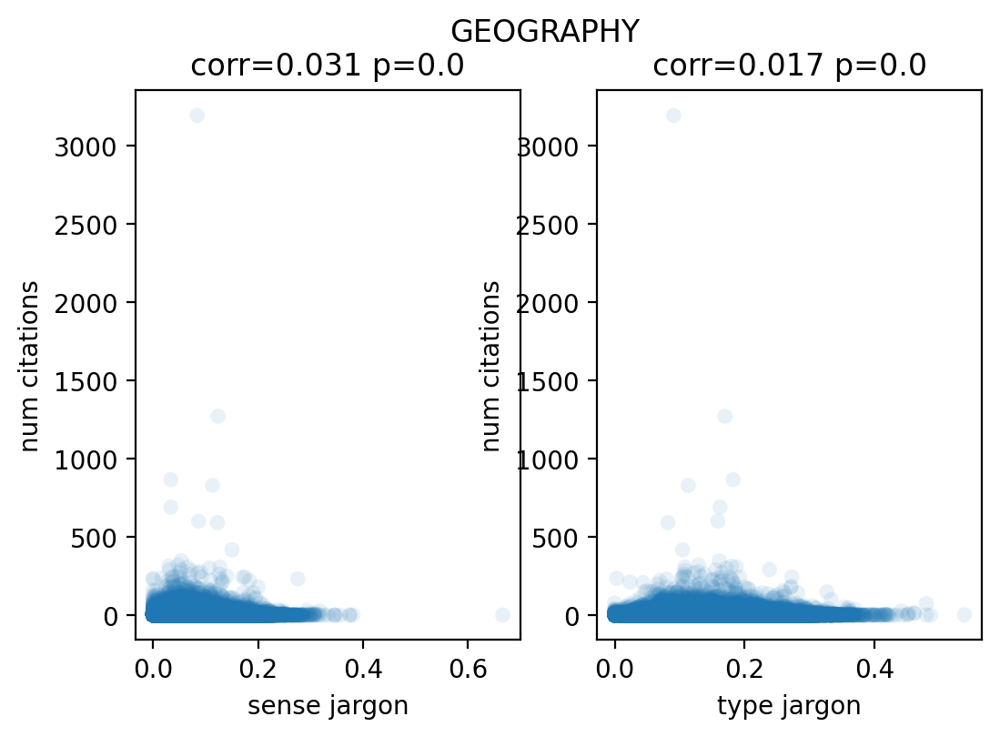

auxiliary OLS regression model parameters: lambda_param    3.406072
dtype: float64
t-value: lambda_param    10.804576
dtype: float64
t critical value: -2.326377108276374

Overdispersion ratio: 16.42037591460692
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               127561
Model:                            GLM   Df Residuals:                   127551
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.3715e+05
Date:                Mon, 05 Dec 2022   Deviance:                       82613.
Time:                        09:12:21   Pearson chi2:                 1.80e+05
No. Iterations:                    24   Pseudo R-squ. (CS):             0.3426
Covariance Type:            nonrobust                                         

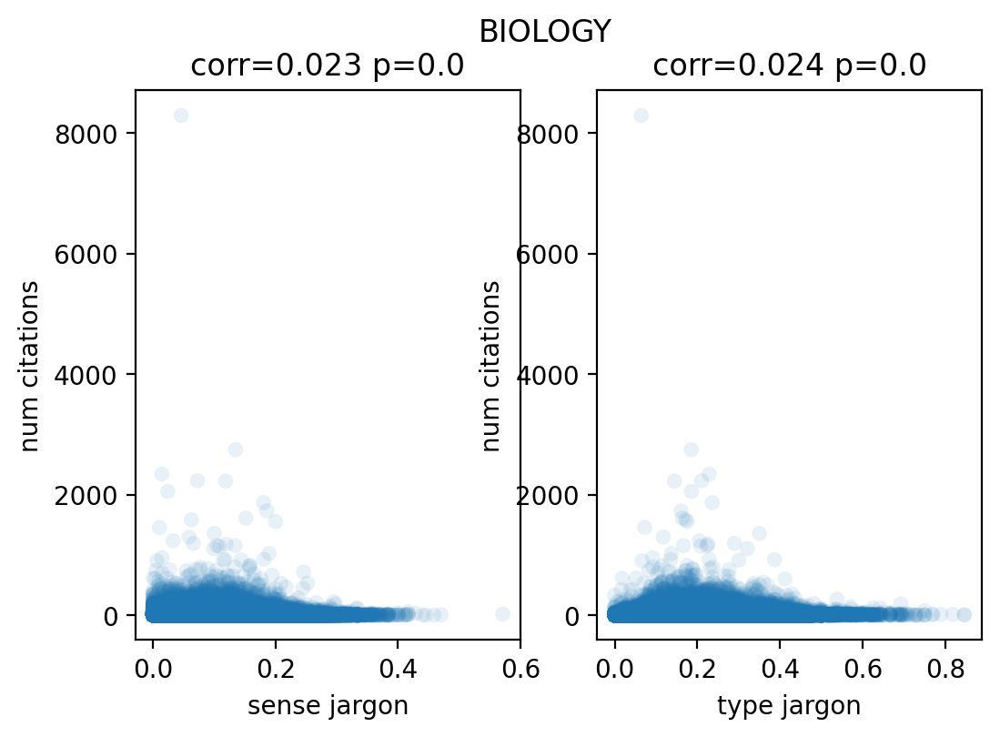

auxiliary OLS regression model parameters: lambda_param    2.430512
dtype: float64
t-value: lambda_param    9.601271
dtype: float64
t critical value: -2.3263523954161864

Overdispersion ratio: 24.8052757322421
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               824768
Model:                            GLM   Df Residuals:                   824758
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.1230e+06
Date:                Mon, 05 Dec 2022   Deviance:                   6.8386e+05
Time:                        09:13:02   Pearson chi2:                 1.27e+06
No. Iterations:                    26   Pseudo R-squ. (CS):             0.3015
Covariance Type:            nonrobust                                         


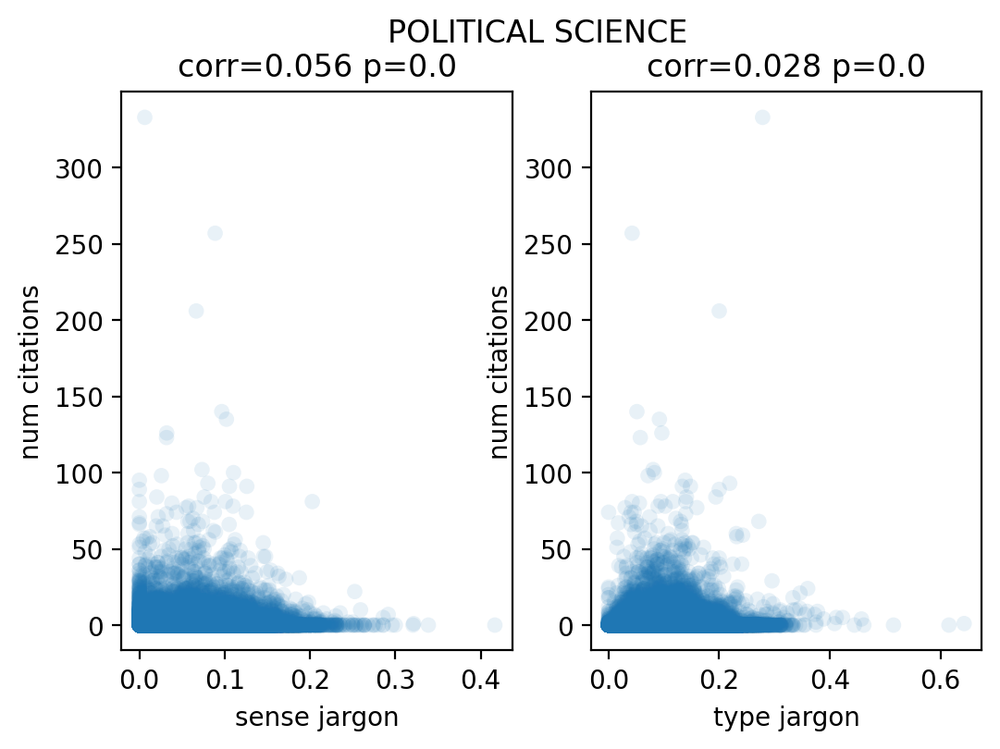

auxiliary OLS regression model parameters: lambda_param    2.12383
dtype: float64
t-value: lambda_param    4.10096
dtype: float64
t critical value: -2.326430758075538

Overdispersion ratio: 10.678922334917184
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:                44994
Model:                            GLM   Df Residuals:                    44984
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -46040.
Date:                Mon, 05 Dec 2022   Deviance:                       35503.
Time:                        09:13:05   Pearson chi2:                 1.18e+05
No. Iterations:                    33   Pseudo R-squ. (CS):             0.4357
Covariance Type:            nonrobust                                         
 

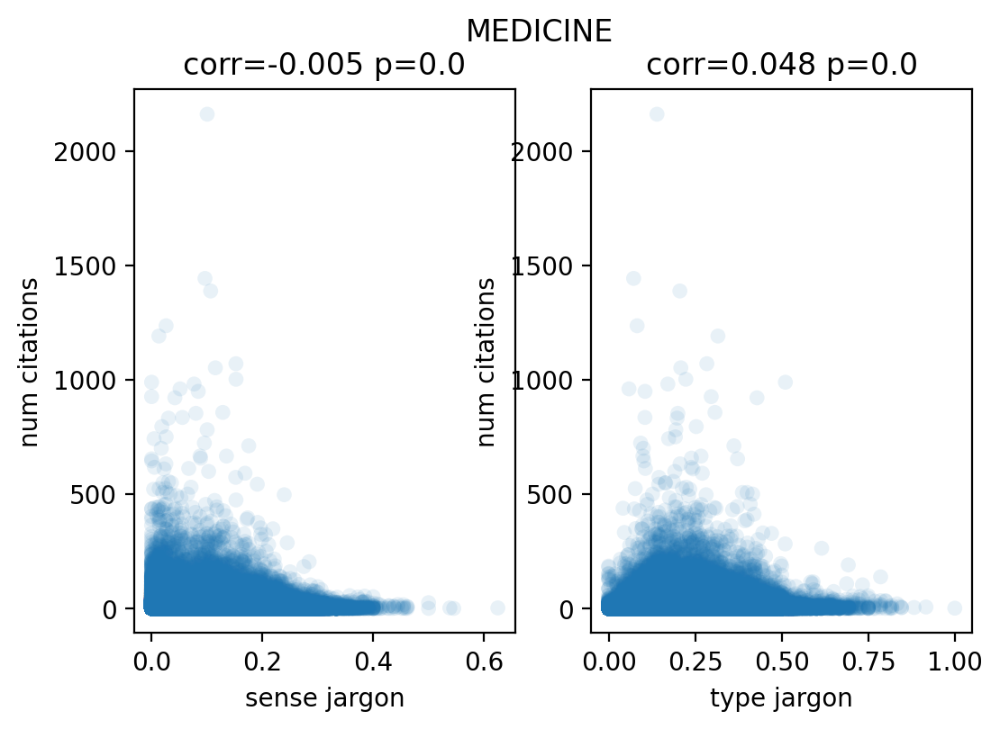

auxiliary OLS regression model parameters: lambda_param    1.613597
dtype: float64
t-value: lambda_param    31.431819
dtype: float64
t critical value: -2.326351151136522

Overdispersion ratio: 16.905585920805475
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:              1137923
Model:                            GLM   Df Residuals:                  1137913
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.6108e+06
Date:                Mon, 05 Dec 2022   Deviance:                   1.2586e+06
Time:                        09:14:01   Pearson chi2:                 2.50e+06
No. Iterations:                    23   Pseudo R-squ. (CS):             0.4018
Covariance Type:            nonrobust                                        

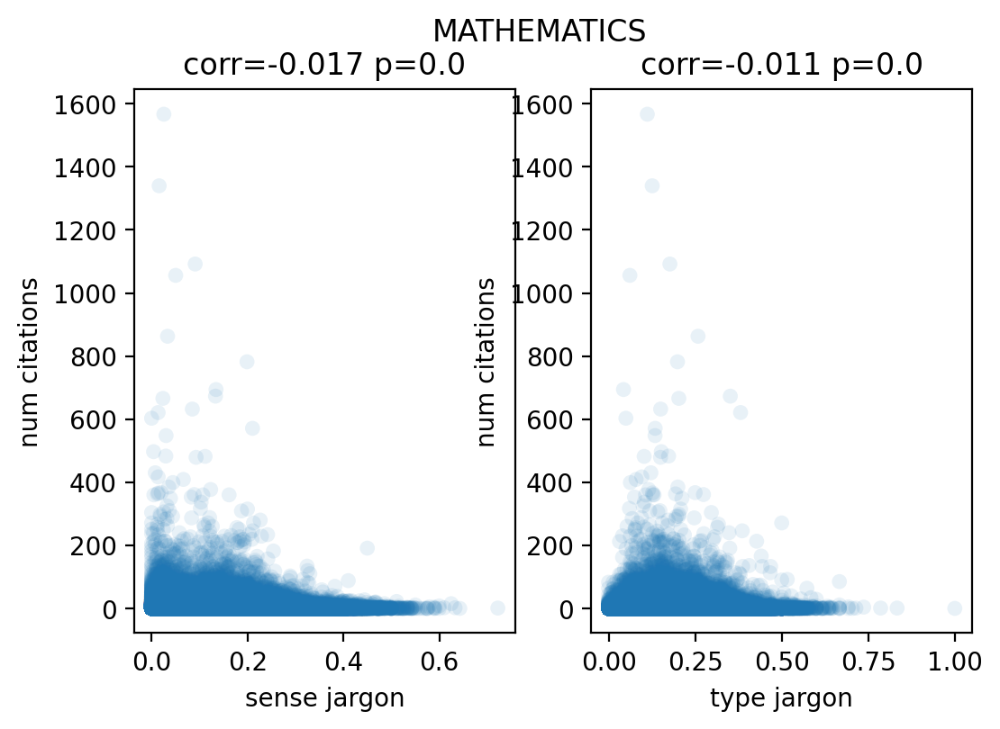

auxiliary OLS regression model parameters: lambda_param    3.19574
dtype: float64
t-value: lambda_param    10.254215
dtype: float64
t critical value: -2.326358136612079

Overdispersion ratio: 18.635998592751392
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               363369
Model:                            GLM   Df Residuals:                   363359
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.2800e+05
Date:                Mon, 05 Dec 2022   Deviance:                   2.7198e+05
Time:                        09:14:21   Pearson chi2:                 7.17e+05
No. Iterations:                    32   Pseudo R-squ. (CS):             0.2746
Covariance Type:            nonrobust                                         

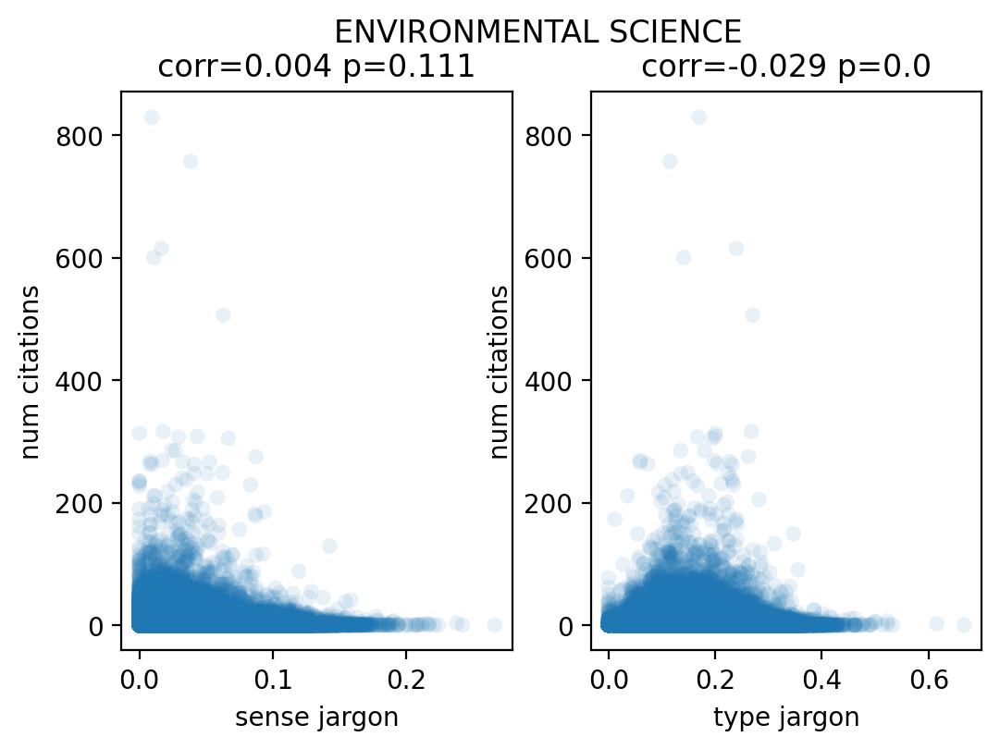

auxiliary OLS regression model parameters: lambda_param    1.431172
dtype: float64
t-value: lambda_param    20.441399
dtype: float64
t critical value: -2.3263749238644618

Overdispersion ratio: 11.401835721080092
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               137862
Model:                            GLM   Df Residuals:                   137852
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.2431e+05
Date:                Mon, 05 Dec 2022   Deviance:                   1.3487e+05
Time:                        09:14:28   Pearson chi2:                 2.90e+05
No. Iterations:                    25   Pseudo R-squ. (CS):             0.6346
Covariance Type:            nonrobust                                       

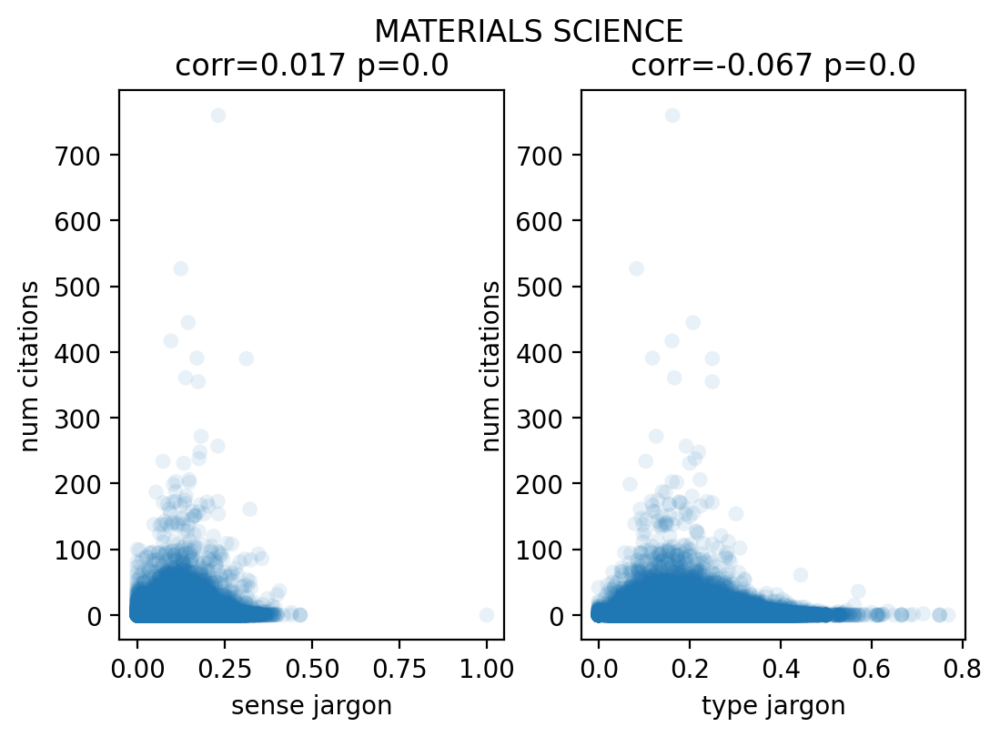

auxiliary OLS regression model parameters: lambda_param    1.551193
dtype: float64
t-value: lambda_param    18.894807
dtype: float64
t critical value: -2.3263728010966647

Overdispersion ratio: 9.807204504949727
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               149602
Model:                            GLM   Df Residuals:                   149592
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -2.2310e+05
Date:                Mon, 05 Dec 2022   Deviance:                   1.4929e+05
Time:                        09:14:36   Pearson chi2:                 3.61e+05
No. Iterations:                    27   Pseudo R-squ. (CS):             0.4273
Covariance Type:            nonrobust                                        

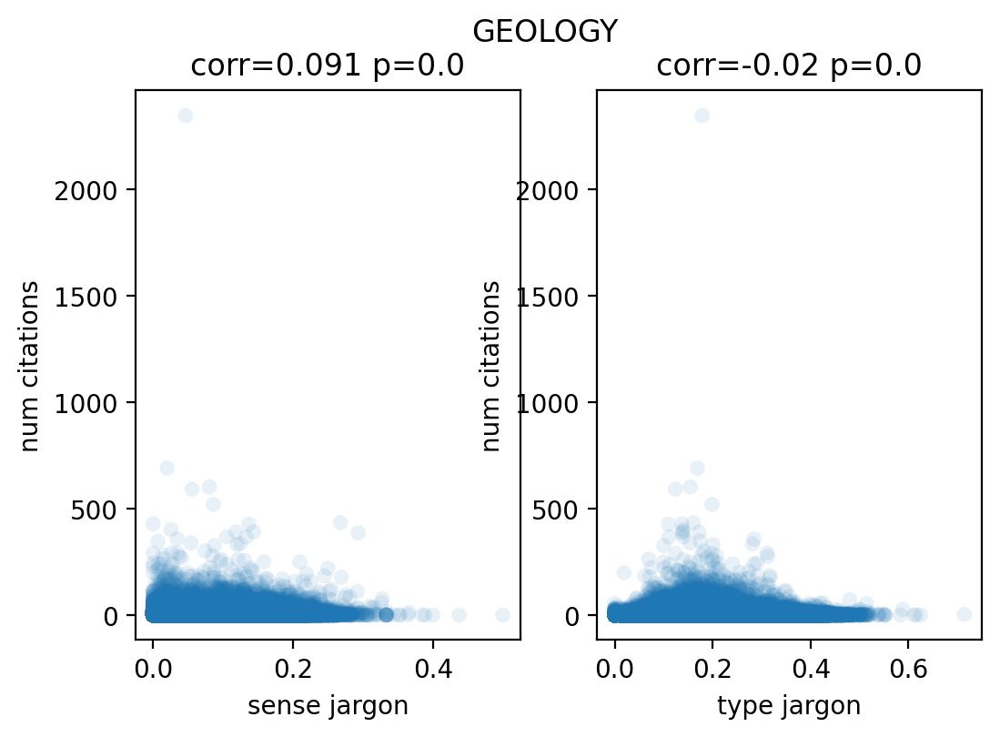

auxiliary OLS regression model parameters: lambda_param    1.359917
dtype: float64
t-value: lambda_param    6.154377
dtype: float64
t critical value: -2.3263587381392306

Overdispersion ratio: 12.072843274514614
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               343250
Model:                            GLM   Df Residuals:                   343240
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -6.2351e+05
Date:                Mon, 05 Dec 2022   Deviance:                   3.5454e+05
Time:                        09:14:54   Pearson chi2:                 7.28e+05
No. Iterations:                    19   Pseudo R-squ. (CS):             0.5449
Covariance Type:            nonrobust                                        

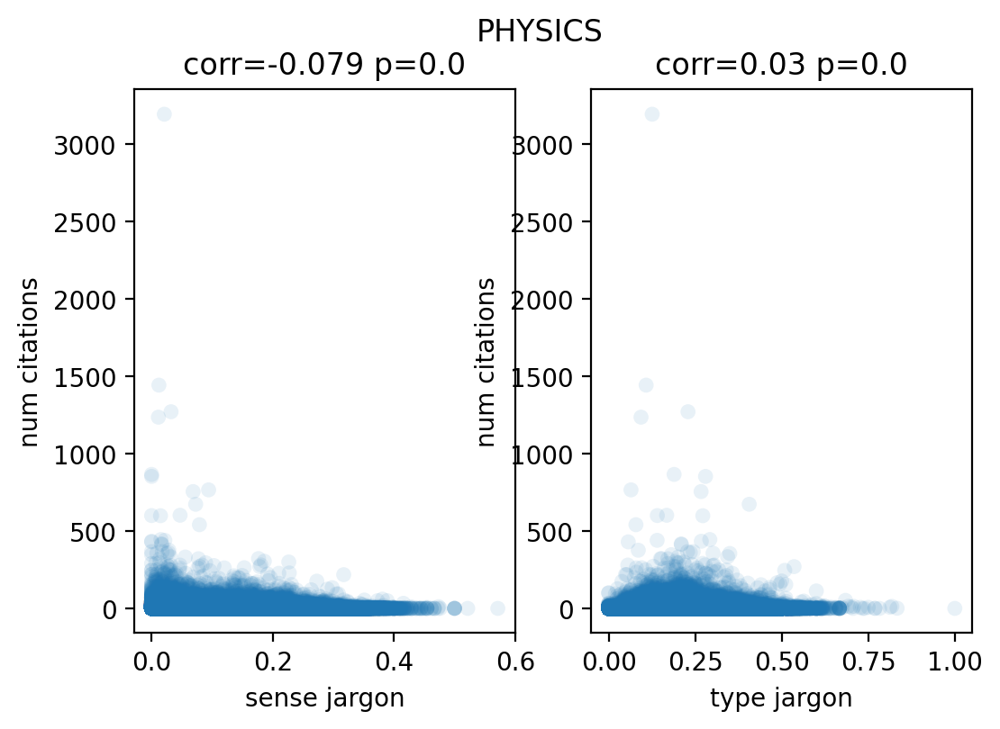

auxiliary OLS regression model parameters: lambda_param    2.147362
dtype: float64
t-value: lambda_param    14.530525
dtype: float64
t critical value: -2.3263536223406853

Overdispersion ratio: 13.559225280136712
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               648729
Model:                            GLM   Df Residuals:                   648719
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -1.0023e+06
Date:                Mon, 05 Dec 2022   Deviance:                   6.0584e+05
Time:                        09:15:26   Pearson chi2:                 2.05e+06
No. Iterations:                    22   Pseudo R-squ. (CS):             0.3457
Covariance Type:            nonrobust                                       

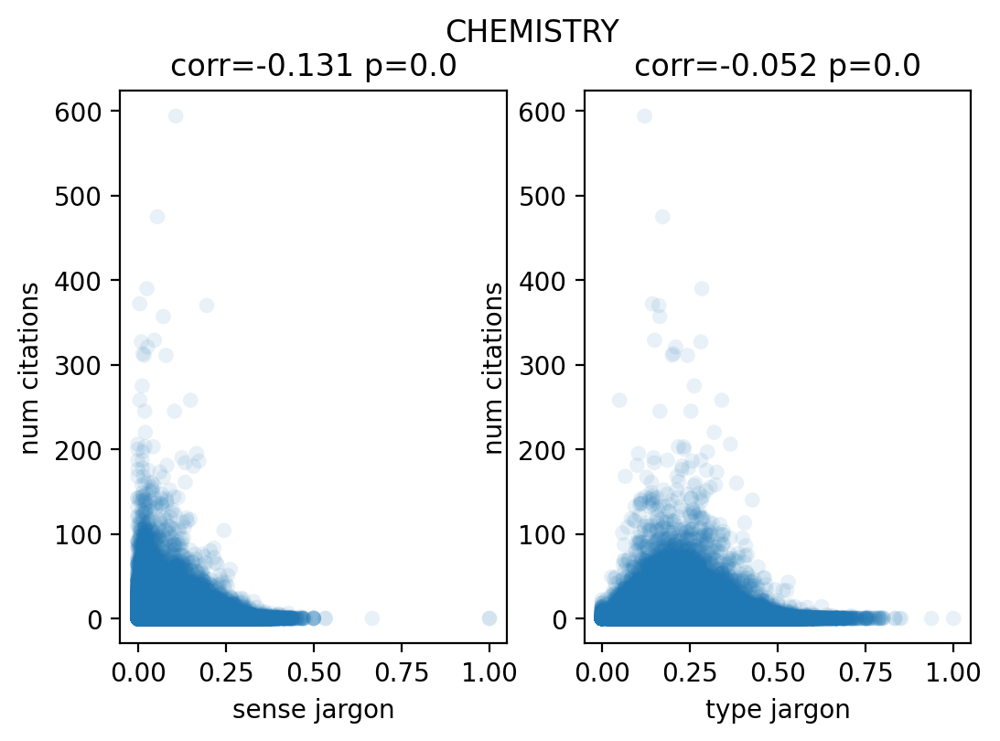

auxiliary OLS regression model parameters: lambda_param    1.306037
dtype: float64
t-value: lambda_param    16.217005
dtype: float64
t critical value: -2.3263539520798204

Overdispersion ratio: 8.020639597543443
                 Generalized Linear Model Regression Results                  
Dep. Variable:          num_citations   No. Observations:               613535
Model:                            GLM   Df Residuals:                   613525
Model Family:        NegativeBinomial   Df Model:                            9
Link Function:                    Log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:            -8.8074e+05
Date:                Mon, 05 Dec 2022   Deviance:                   6.3277e+05
Time:                        09:15:58   Pearson chi2:                 1.45e+06
No. Iterations:                    29   Pseudo R-squ. (CS):             0.4686
Covariance Type:            nonrobust                                        

In [19]:
# separate out analysis by level 0 FOS
for fos in papers_to_regress: 
    print("###########################")
    print("-------", fos.upper(), "-------")
    print("###########################")
    fos_papers = set()
    num_fields = Counter()
    for paper_d in papers_to_regress[fos]: 
        fos_papers.add(paper_d['paper_id'])
        assert len(paper_d['level 1 fos']) == 1 or len(paper_d['level 1 fos']) == 2
        num_fields[paper_d['paper_id']] = len(paper_d['level 1 fos'])
    this_fos_df = var_df_transformed[var_df_transformed['paper id'].isin(fos_papers)].copy()
    # add in number of level 1 fields of study in that FOS
    this_fos_df['num fields'] = this_fos_df['paper id'].apply(lambda x: num_fields.get(x))
    
    this_fos_sense = sense_scores[fos]
    this_fos_df['sense jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_sense.get(x))
    this_fos_type = type_scores[fos]
    this_fos_df['type jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_type.get(x))
    this_fos_df = this_fos_df.dropna()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, dpi=200)
    fig.suptitle(fos.upper())
    r, p = scipy.stats.pearsonr(x=this_fos_df['sense jargon'], y=this_fos_df['num citations'])
    sns.scatterplot(x='sense jargon', y='num citations', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax1)
    ax1.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    r, p = scipy.stats.pearsonr(x=this_fos_df['type jargon'], y=this_fos_df['num citations'])
    sns.scatterplot(x='type jargon', y='num citations', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax2)
    ax2.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    plt.show()
    
    cols_with_no_space = {}
    for col in this_fos_df.columns: 
        cols_with_no_space[col] = col.replace(" ", "_")
    this_fos_df = this_fos_df.rename(columns=cols_with_no_space)
    
    yr = [0, 1, 2]
    nf = [1, 2]
    expr = """num_citations ~ C(year_bin,levels=yr) + abstract_length + journal_avg_cite + log_num_authors + log_num_refs + C(num_fields,levels=nf) + sense_jargon + type_jargon"""
    
    y, X = dmatrices(expr, this_fos_df, return_type='dataframe')
    poisson_training_results = sm.GLM(y, X, family=sm.families.Poisson()).fit()
    
#     print("Poisson results")
#     print(poisson_training_results.summary())
#     print()
    this_fos_df['lambda_param'] = poisson_training_results.mu
    this_fos_df['aux_ols_dep'] = this_fos_df.apply(lambda x: ((x['num_citations'] - x['lambda_param'])**2 - x['lambda_param']) / x['lambda_param'], axis=1)
    ols_expr = """aux_ols_dep ~ lambda_param - 1"""
    aux_olsr_results = smf.ols(ols_expr, this_fos_df).fit()
    print("auxiliary OLS regression model parameters:", aux_olsr_results.params)
    print("t-value:", aux_olsr_results.tvalues)
    degrees_freedom = len(this_fos_df) - 1
    t_critical_val = scipy.stats.t.ppf(0.01, degrees_freedom)
    print("t critical value:", t_critical_val)
    print()
    ratio = poisson_training_results.pearson_chi2 / poisson_training_results.df_resid
    print("Overdispersion ratio:", ratio)
    
    nb2_training_results = sm.GLM(y, X,family=sm.families.NegativeBinomial(alpha=aux_olsr_results.params[0])).fit()
    print(nb2_training_results.summary())
    
    print("Bonferroni corrected p-vals (-1, -2):", nb2_training_results.pvalues[-1]*76, nb2_training_results.pvalues[-2]*76)

In [20]:
this_fos_df

,paper_id,year_bin,abstract_length,journal_avg_cite,num_citations,log_num_authors,log_num_refs,log_num_citations,num_fields,sense_jargon,type_jargon,lambda_param,aux_ols_dep
1,94554780,1,80,10.639529,4,0.477121,0.0,0.698970,1,0.087500,0.337500,1.020271,7.702384
3,94557639,0,182,1.271349,0,1.000000,0.0,0.000000,2,0.236264,0.274725,0.552504,-0.447496
5,94558998,1,88,1.227300,4,0.778151,0.0,0.698970,1,0.113636,0.147727,1.083188,6.854400
15,2874988,1,85,0.847125,1,0.903090,0.0,0.301030,1,0.141176,0.152941,1.085531,-0.993261
30,123623002,1,217,3.716754,11,0.698970,0.0,1.079181,1,0.027650,0.207373,1.909056,42.291151
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5396471,97889126,0,149,4.462289,1,0.845098,0.0,0.301030,1,0.114094,0.174497,1.108920,-0.989302
5396484,136744999,1,217,2.709667,0,0.477121,0.0,0.000000,1,0.023041,0.211982,1.423912,0.423912
5396550,102057733,1,111,0.083429,0,0.301030,0.0,0.000000,1,0.027027,0.279279,0.711541,-0.288459
5396551,102058478,1,96,0.090026,0,0.954243,0.0,0.000000,1,0.156250,0.250000,0.922430,-0.077570


## Interdisciplinarity

In [21]:
def get_paper_fos(): 
    time_fos_df = pd.read_parquet(LOGS + 'citing_papers/')
    paper_fos = dict(zip(time_fos_df.paper_id, time_fos_df.fos))
    return paper_fos
def get_level_topics(): 
    level_to_topics = defaultdict(set)
    with open(DATA + 'fos_level.csv', 'r') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader: 
            level_to_topics[row['level']].add(row['displayname'].lower())
    return level_to_topics

In [22]:
def get_citation_matrix(): 
    level_to_topics = get_level_topics()
    level1 = sorted(level_to_topics['1'])
    m = np.zeros((len(level1), len(level1))) # matrix of level 1
    for f in tqdm(os.listdir(LOGS + 'citation_matrix/')): 
        with open(LOGS + 'citation_matrix/' + f, 'r') as infile: 
            d = json.load(infile)
        for key in d: 
            fos_list = key.split('@')
            idx1 = level1.index(fos_list[0])
            idx2 = level1.index(fos_list[1])
            m[idx1, idx2] += d[key]
    return m, level1

In [23]:
m, level1 = get_citation_matrix()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:21<00:00,  4.56it/s]


In [24]:
sim_m = cosine_similarity(m)

In [25]:
# just sanity check that results make sense
idx = level1.index("chemical engineering")
for idx2 in np.argpartition(sim_m[idx], -4)[-4:]: 
    print(idx2, level1[idx2])

152 inorganic chemistry
237 polymer science
236 polymer chemistry
50 chemical engineering


In [26]:
paper_citations = dict(zip(df['paper id'], df['citations']))

In [27]:
# get paper to fos
time_fos_df = pd.read_parquet(LOGS + 'citing_papers/')
paper_fos = dict(zip(time_fos_df.paper_id, time_fos_df.fos))

In [28]:
level_to_topics = get_level_topics()

In [29]:
# get counts of all level 1 FOS that cite a paper 
paper_citing_fos = defaultdict(Counter)
for paper_id in tqdm(paper_citations): 
    for other_paper in paper_citations[paper_id]: 
        if other_paper not in paper_fos: continue
        other_fos = [field for field in paper_fos[other_paper].split(',') if field in level_to_topics['1']]
        paper_citing_fos[paper_id].update(other_fos)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5396569/5396569 [01:12<00:00, 74035.71it/s]


In [30]:
print(paper_citing_fos['41518354'])
print(paper_citations['41518354'])

Counter({'botany': 8, 'biophysics': 5, 'biological system': 4, 'photochemistry': 4, 'analytical chemistry': 2, 'horticulture': 2, 'ecology': 1, 'physical chemistry': 1, 'thermodynamics': 1, 'simulation': 1, 'chemical physics': 1, 'environmental chemistry': 1})
['27816279' '73608373' '18756823' '9163854' '12635756' '15015008'
 '10824240' '9308462' '10515447' '18901411' '14866768' '17779008'
 '5041593' '4185841' '8960807' '15485352' '17797023']


In [31]:
def gini(citing_fos):
    '''
    1 - sum((2i-n-1)x_i)/(n*sum(x_i))
    where i is the index,  x_i is the number of references 
    in the ith FOS, and the specialties are 
    sorted by x_i in nondecreasing order
    n is the number of specialties in the paper's references,
    '''
    # nondecreasing order
    sorted_FOS = [tup[0] for tup in sorted(citing_fos.items(), key=lambda item: item[1])]
    num_sum = 0
    denom_sum = 0
    n = len(sorted_FOS)
    for i, field in enumerate(sorted_FOS): 
        num_sum += (2*i - n - 1)*citing_fos[field]
        denom_sum += citing_fos[field]
    return 1 - num_sum/(n*denom_sum)

def calc_disparity(citing_fos): 
    '''
    1/(n*(n-1)) sum_(i != j) d_ij
    where d_ij = 1 - cosine similarity of i to j
    '''
    this_FOS = list(citing_fos.keys())
    n = len(this_FOS)
    sum_sim = 0
    for i, field1 in enumerate(this_FOS): 
        for j, field2 in enumerate(this_FOS):
            if i == j: continue
            sim_i = level1.index(field1)
            sim_j = level1.index(field2)
            ij_sim = sim_m[sim_i, sim_j]
            sum_sim += 1 - ij_sim
    if n-1 == 0: return 0
    return 1/(n*(n-1)) * sum_sim

In [32]:
paper_variety = Counter()
paper_balance = Counter()
paper_disparity = Counter()
paper_interdis = Counter()
for paper_id in tqdm(paper_citing_fos): 
    citing_fos = paper_citing_fos[paper_id]
    if len(citing_fos) == 0: continue
    variety = len(citing_fos) / float(len(level1))
    balance = gini(citing_fos)
    disparity = calc_disparity(citing_fos)
    if variety * balance * disparity == 0: continue
    
    paper_variety[paper_id] = variety
    paper_balance[paper_id] = balance
    paper_disparity[paper_id] = disparity
    paper_interdis[paper_id] = (variety * balance * disparity)**(1./3.)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2472274/2472274 [05:55<00:00, 6963.90it/s]


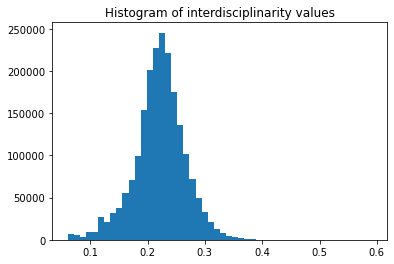

In [33]:
plt.hist(list(paper_interdis.values()), bins=50)
plt.title("Histogram of interdisciplinarity values")
plt.show()

In [34]:
interdisp_df = var_df_transformed.copy()
interdisp_df['variety'] = df['paper id'].apply(lambda x: paper_variety.get(x))
interdisp_df['balance'] = df['paper id'].apply(lambda x: paper_balance.get(x))
interdisp_df['disparity'] = df['paper id'].apply(lambda x: paper_disparity.get(x))
interdisp_df['interdisciplinarity'] = df['paper id'].apply(lambda x: paper_interdis.get(x))

In [35]:
interdisp_df

,paper id,year bin,abstract length,journal avg cite,num citations,log num authors,log num refs,log num citations,variety,balance,disparity,interdisciplinarity
0,94550757,1,133,2.052923,2,0.903090,0.0,0.477121,NaN,NaN,NaN,NaN
1,94554780,1,80,10.639529,4,0.477121,0.0,0.698970,0.020548,1.214286,0.599901,0.246447
2,94556483,0,153,0.597869,0,0.602060,0.0,0.000000,NaN,NaN,NaN,NaN
3,94557639,0,182,1.271349,0,1.000000,0.0,0.000000,NaN,NaN,NaN,NaN
4,94558598,1,69,0.685690,0,0.301030,0.0,0.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5396564,21287420,2,205,2.446298,0,0.602060,0.0,0.000000,NaN,NaN,NaN,NaN
5396565,111501198,2,106,0.295649,0,0.477121,0.0,0.000000,NaN,NaN,NaN,NaN
5396566,111501355,1,89,0.264748,0,0.301030,0.0,0.000000,NaN,NaN,NaN,NaN
5396567,111501641,1,97,0.065007,0,0.301030,0.0,0.000000,NaN,NaN,NaN,NaN


In [36]:
# get most interdisciplinary papers
for tup in paper_interdis.most_common(10): 
    paper_id = tup[0]
    print(paper_id, paper_citing_fos[paper_id])

60610932 Counter({'data mining': 24, 'computer vision': 18, 'machine learning': 15, 'pattern recognition': 14, 'algorithm': 12, 'statistics': 10, 'world wide web': 9, 'developmental psychology': 9, 'marketing': 7, 'social psychology': 7, 'ecology': 6, 'medical education': 5, 'knowledge management': 5, 'finance': 5, 'theoretical computer science': 5, 'cancer research': 5, 'audiology': 5, 'mathematical optimization': 4, 'distributed computing': 4, 'pedagogy': 4, 'econometrics': 4, 'natural language processing': 4, 'immunology': 4, 'simulation': 3, 'computer network': 3, 'environmental engineering': 3, 'neuroscience': 3, 'physical therapy': 3, 'computer security': 3, 'meteorology': 3, 'information retrieval': 3, 'genetics': 3, 'endocrinology': 3, 'advertising': 3, 'molecular biology': 2, 'mathematics education': 2, 'water resource management': 2, 'actuarial science': 2, 'cartography': 2, 'cognitive psychology': 2, 'linguistics': 2, 'multimedia': 2, 'waste management': 2, 'hydrology': 2, '

## Run interdisciplinarity regression

"The Gauss-Markov assumptions assure that the OLS regression coefficients are the Best Linear Unbiased Estimates or BLUE."

https://towardsdatascience.com/testing-the-assumptions-of-linear-regression-f38857abc08a

https://towardsdatascience.com/assumptions-in-ols-regression-why-do-they-matter-9501c800787d

The below code is from
https://www.statsmodels.org/dev/examples/notebooks/generated/linear_regression_diagnostics_plots.html

In [37]:
# base code
import numpy as np
import seaborn as sns
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.graphics.gofplots import ProbPlot
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels
import matplotlib.pyplot as plt
from typing import Type
from scipy.stats import shapiro
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [38]:
style_talk = 'seaborn-talk'    #refer to plt.style.available

class Linear_Reg_Diagnostic():
    """
    Diagnostic plots to identify potential problems in a linear regression fit.
    Mainly,
        a. non-linearity of data
        b. Correlation of error terms
        c. non-constant variance
        d. outliers
        e. high-leverage points
        f. collinearity

    Author:
        Prajwal Kafle (p33ajkafle@gmail.com, where 3 = r)
        Does not come with any sort of warranty.
        Please test the code one your end before using.
    """

    def __init__(self,
                 results: Type[statsmodels.regression.linear_model.RegressionResultsWrapper]) -> None:
        """
        For a linear regression model, generates following diagnostic plots:

        a. residual
        b. qq
        c. scale location and
        d. leverage

        and a table

        e. vif

        Args:
            results (Type[statsmodels.regression.linear_model.RegressionResultsWrapper]):
                must be instance of statsmodels.regression.linear_model object
        """

        if isinstance(results, statsmodels.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)

    def __call__(self, plot_context='seaborn-paper'):
        # print(plt.style.available)
        with plt.style.context(plot_context):
            fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
            self.residual_plot(ax=ax[0,0])
            self.qq_plot(ax=ax[0,1])
            self.scale_location_plot(ax=ax[1,0])
            self.leverage_plot(ax=ax[1,1])
            plt.show()

        self.vif_table()
        return fig, ax


    def residual_plot(self, ax=None):
        """
        Residual vs Fitted Plot

        Graphical tool to identify non-linearity.
        (Roughly) Horizontal red line is an indicator that the residual has a linear pattern
        """
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5},
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.sort(residual_abs))
        abs_resid_top_3 = abs_resid[:3]
        for i, _ in enumerate(abs_resid_top_3):
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='C3')

        ax.set_title('Residuals vs Fitted', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def qq_plot(self, ax=None):
        """
        Standarized Residual vs Theoretical Quantile plot

        Used to visually check if residuals are normally distributed.
        Points spread along the diagonal line will suggest so.
        """
        if ax is None:
            fig, ax = plt.subplots()

        QQ = ProbPlot(self.residual_norm)
        QQ.qqplot(line='45', alpha=0.5, lw=1, ax=ax)

        # annotations
        abs_norm_resid = np.flip(np.argsort(np.abs(self.residual_norm)), 0)
        abs_norm_resid_top_3 = abs_norm_resid[:3]
        for r, i in enumerate(abs_norm_resid_top_3):
            ax.annotate(
                i,
                xy=(np.flip(QQ.theoretical_quantiles, 0)[r], self.residual_norm[i]),
                ha='right', color='C3')

        ax.set_title('Normal Q-Q', fontweight="bold")
        ax.set_xlabel('Theoretical Quantiles')
        ax.set_ylabel('Standardized Residuals')
        return ax

    def scale_location_plot(self, ax=None):
        """
        Sqrt(Standarized Residual) vs Fitted values plot

        Used to check homoscedasticity of the residuals.
        Horizontal line will suggest so.
        """
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5);
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='C3')
        ax.set_title('Scale-Location', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None):
        """
        Residual vs Leverage plot

        Points falling outside Cook's distance curves are considered observation that can sway the fit
        aka are influential.
        Good to have none outside the curves.
        """
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5);

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = 'C3')

        xtemp, ytemp = self.__cooks_dist_line(0.5) # 0.5 line
        ax.plot(xtemp, ytemp, label="Cook's distance", lw=1, ls='--', color='red')
        xtemp, ytemp = self.__cooks_dist_line(1) # 1 line
        ax.plot(xtemp, ytemp, lw=1, ls='--', color='red')

        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_title('Residuals vs Leverage', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        ax.legend(loc='upper right')
        return ax

    def vif_table(self):
        """
        VIF table

        VIF, the variance inflation factor, is a measure of multicollinearity.
        VIF > 5 for a variable indicates that it is highly collinear with the
        other input variables.
        """
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        print(vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y

###########################
------- ART -------
###########################


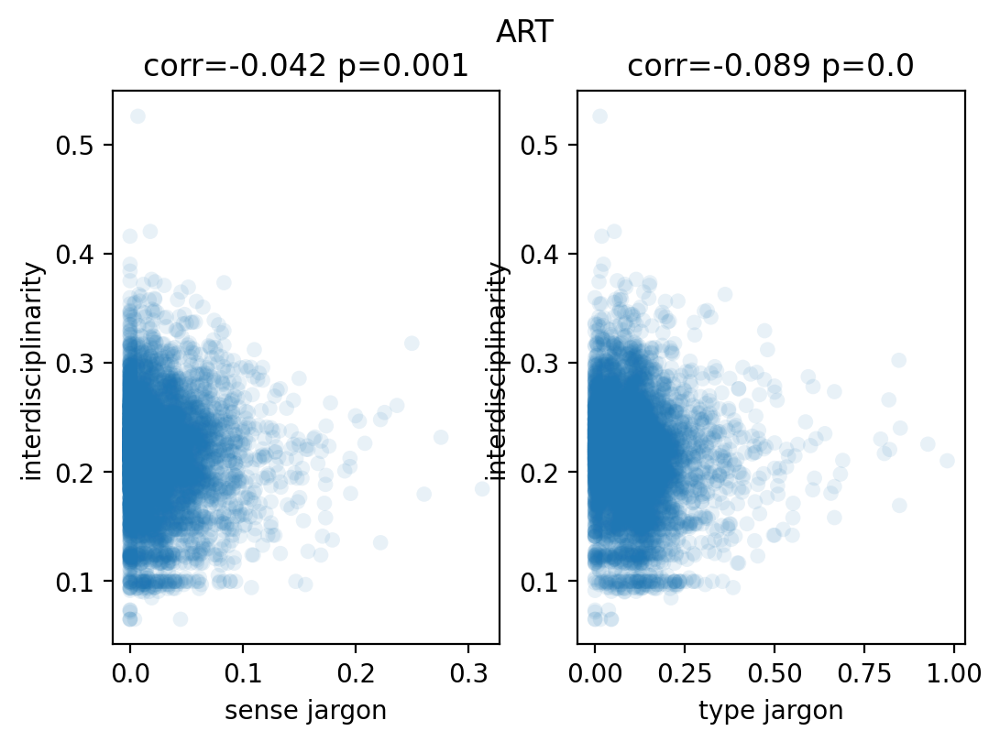

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.050
Model:                             OLS   Adj. R-squared:                  0.048
Method:                  Least Squares   F-statistic:                     33.91
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):           8.45e-59
Time:                         09:25:24   Log-Likelihood:                 9606.4
No. Observations:                 5826   AIC:                        -1.919e+04
Df Residuals:                     5816   BIC:                        -1.913e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

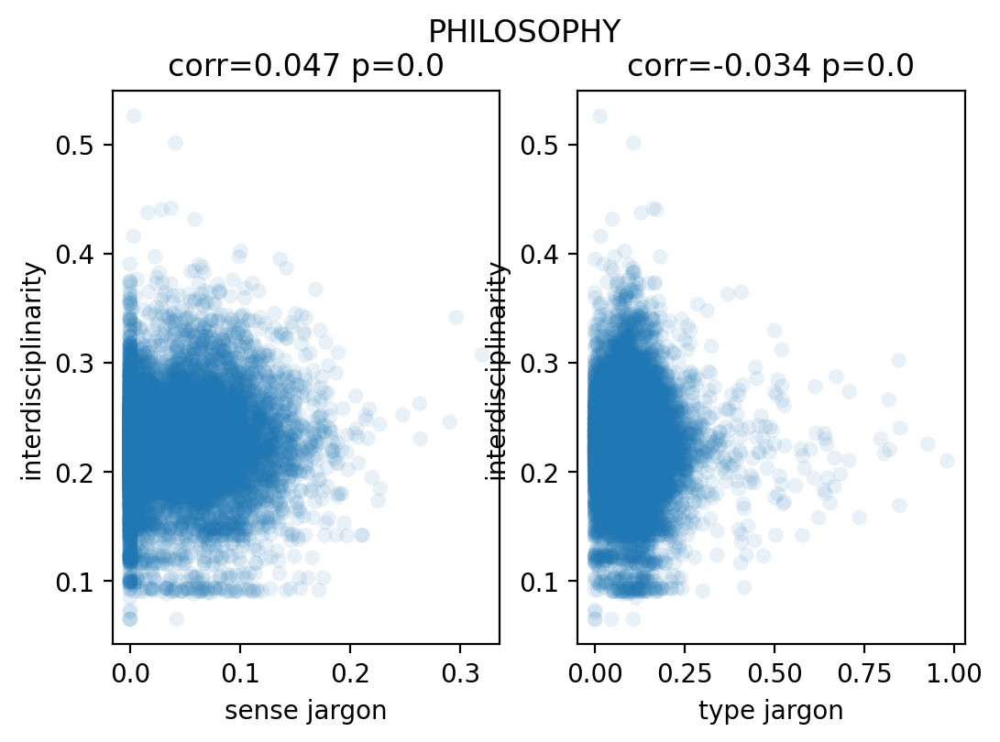

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.060
Model:                             OLS   Adj. R-squared:                  0.059
Method:                  Least Squares   F-statistic:                     74.77
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):          1.09e-134
Time:                         09:25:26   Log-Likelihood:                 18069.
No. Observations:                10559   AIC:                        -3.612e+04
Df Residuals:                    10549   BIC:                        -3.605e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

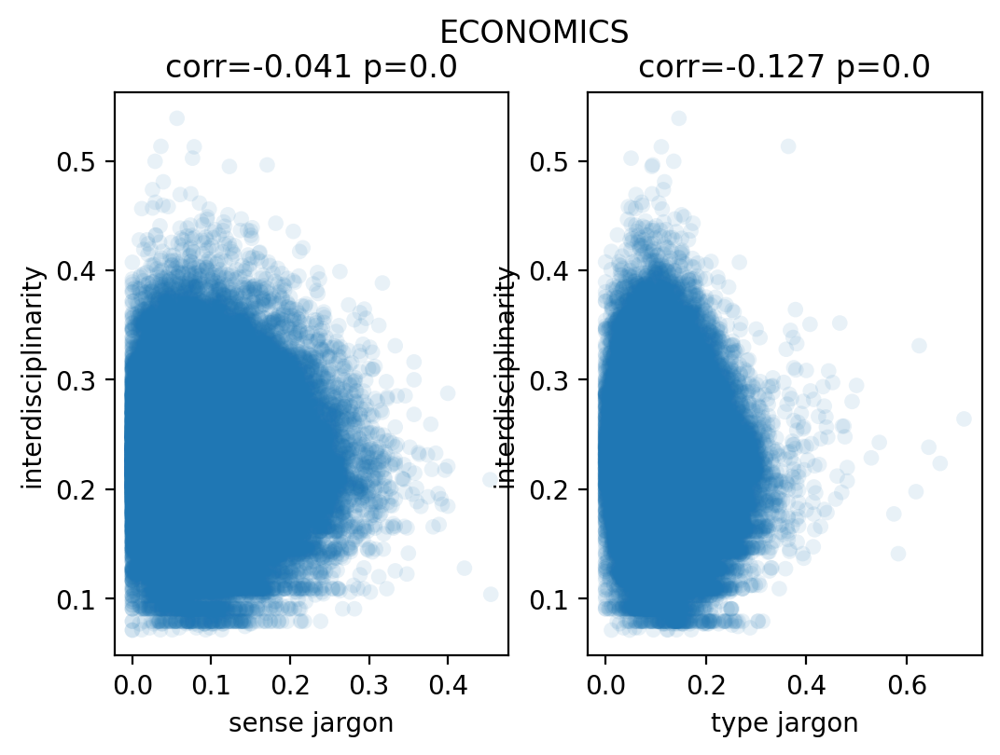

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.122
Model:                             OLS   Adj. R-squared:                  0.121
Method:                  Least Squares   F-statistic:                     1898.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:25:32   Log-Likelihood:             2.0599e+05
No. Observations:               123476   AIC:                        -4.120e+05
Df Residuals:                   123466   BIC:                        -4.119e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

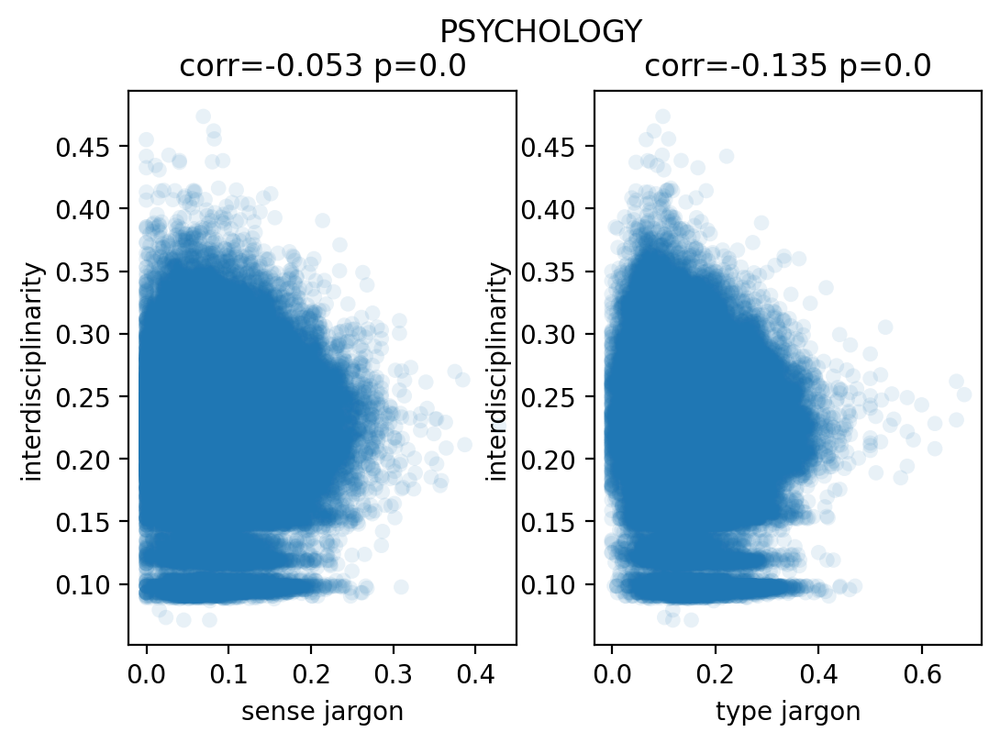

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.104
Model:                             OLS   Adj. R-squared:                  0.104
Method:                  Least Squares   F-statistic:                     1718.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:25:37   Log-Likelihood:             2.3130e+05
No. Observations:               133319   AIC:                        -4.626e+05
Df Residuals:                   133309   BIC:                        -4.625e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

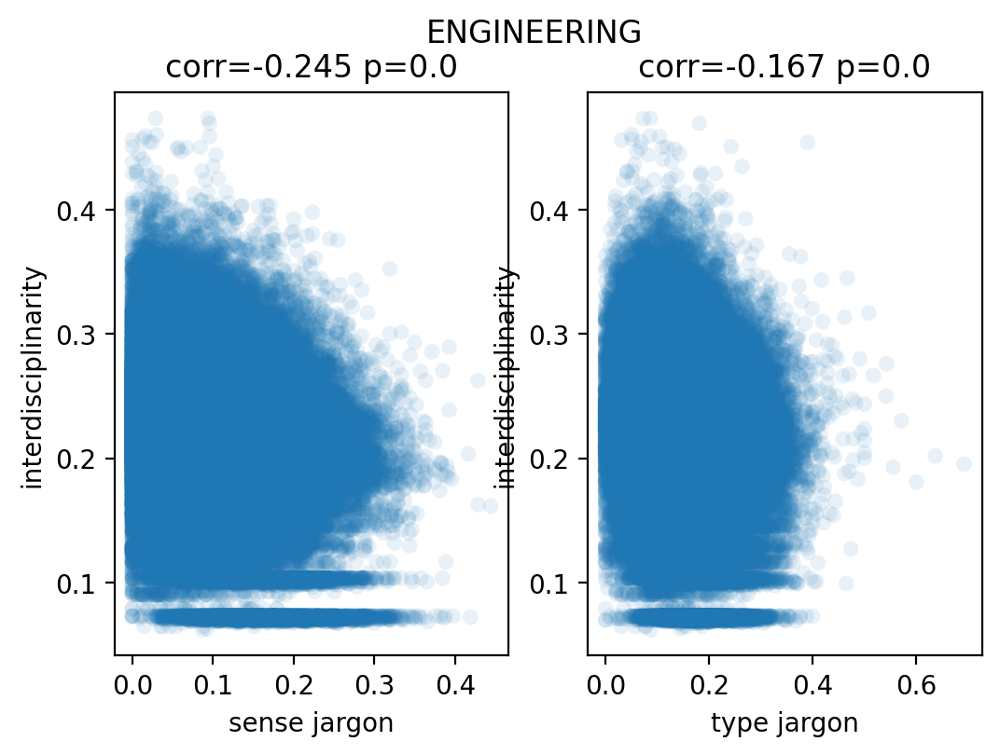

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.147
Model:                             OLS   Adj. R-squared:                  0.147
Method:                  Least Squares   F-statistic:                     3836.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:25:49   Log-Likelihood:             3.4229e+05
No. Observations:               199790   AIC:                        -6.846e+05
Df Residuals:                   199780   BIC:                        -6.845e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

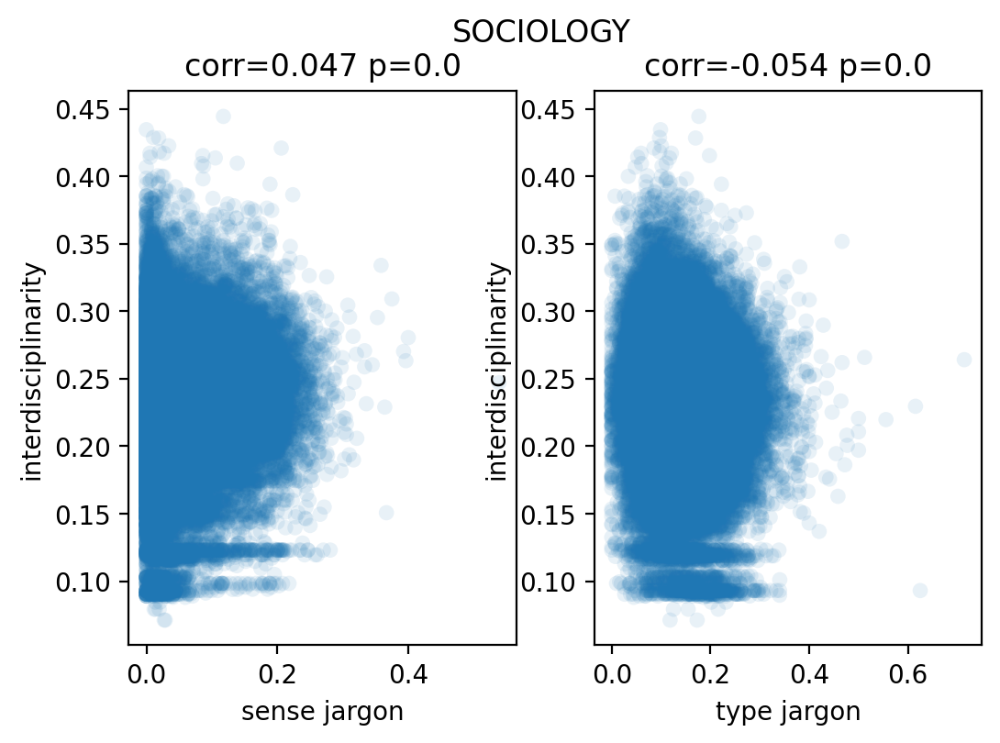

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.115
Model:                             OLS   Adj. R-squared:                  0.115
Method:                  Least Squares   F-statistic:                     809.9
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:25:52   Log-Likelihood:                 98457.
No. Observations:                56088   AIC:                        -1.969e+05
Df Residuals:                    56078   BIC:                        -1.968e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

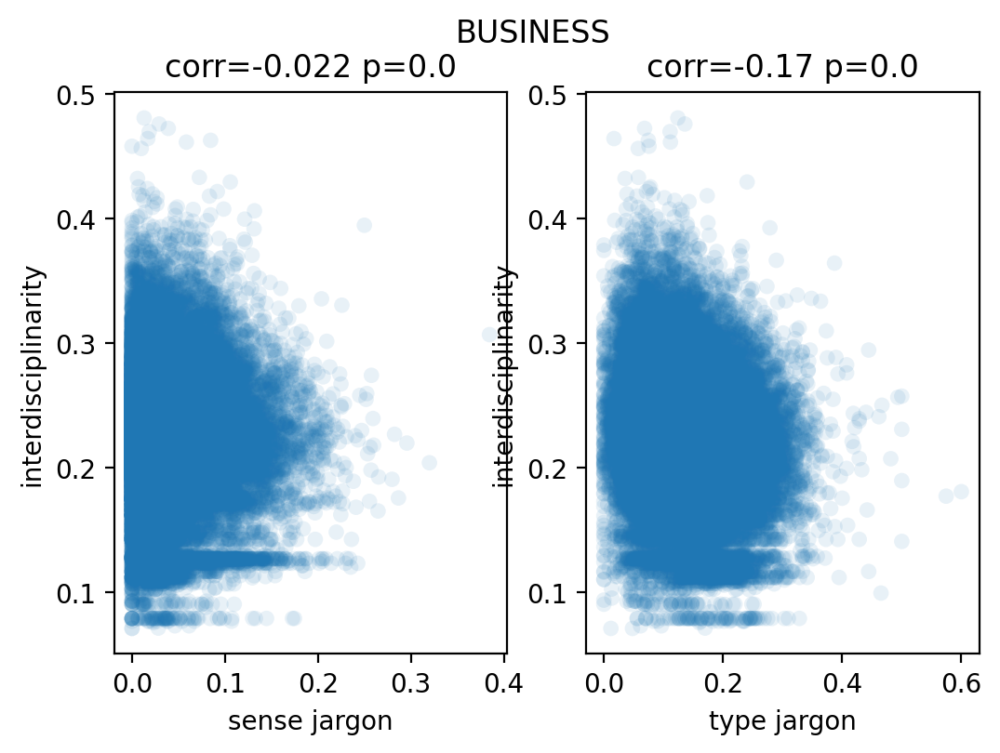

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.128
Model:                             OLS   Adj. R-squared:                  0.128
Method:                  Least Squares   F-statistic:                     646.6
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:25:55   Log-Likelihood:                 66290.
No. Observations:                39602   AIC:                        -1.326e+05
Df Residuals:                    39592   BIC:                        -1.325e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

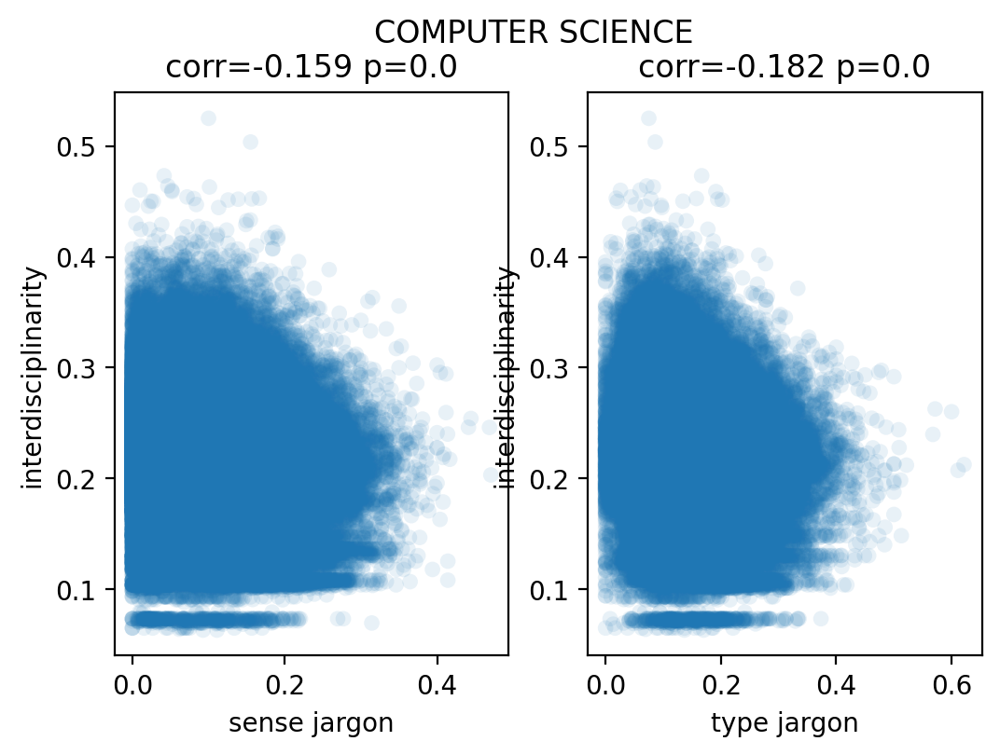

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.125
Model:                             OLS   Adj. R-squared:                  0.125
Method:                  Least Squares   F-statistic:                     3105.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:03   Log-Likelihood:             3.3995e+05
No. Observations:               196234   AIC:                        -6.799e+05
Df Residuals:                   196224   BIC:                        -6.798e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

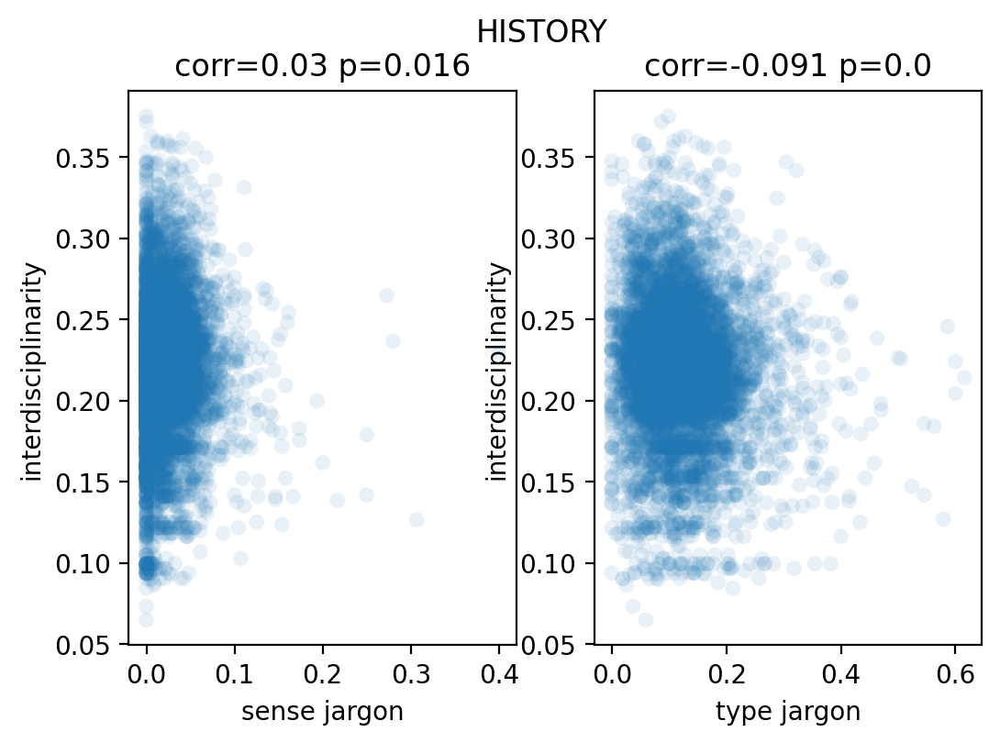

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.071
Model:                             OLS   Adj. R-squared:                  0.069
Method:                  Least Squares   F-statistic:                     54.92
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):           5.64e-97
Time:                         09:26:05   Log-Likelihood:                 11526.
No. Observations:                 6513   AIC:                        -2.303e+04
Df Residuals:                     6503   BIC:                        -2.297e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

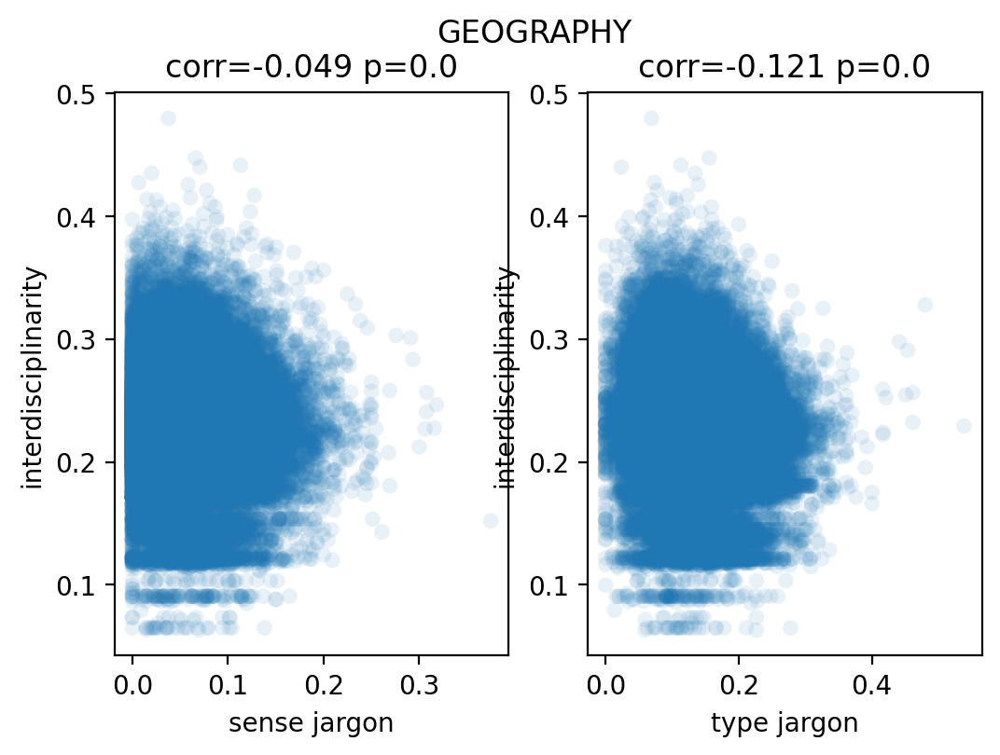

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.077
Model:                             OLS   Adj. R-squared:                  0.077
Method:                  Least Squares   F-statistic:                     475.6
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:07   Log-Likelihood:                 90140.
No. Observations:                51408   AIC:                        -1.803e+05
Df Residuals:                    51398   BIC:                        -1.802e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

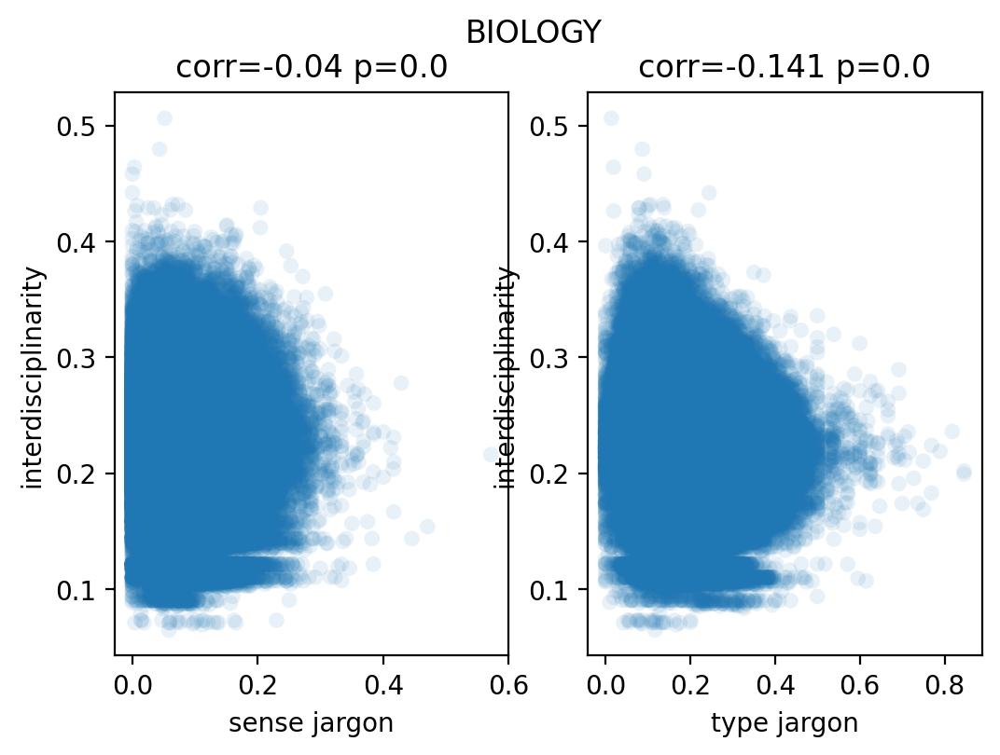

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.069
Model:                             OLS   Adj. R-squared:                  0.069
Method:                  Least Squares   F-statistic:                     3967.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:24   Log-Likelihood:             8.9304e+05
No. Observations:               481103   AIC:                        -1.786e+06
Df Residuals:                   481093   BIC:                        -1.786e+06
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

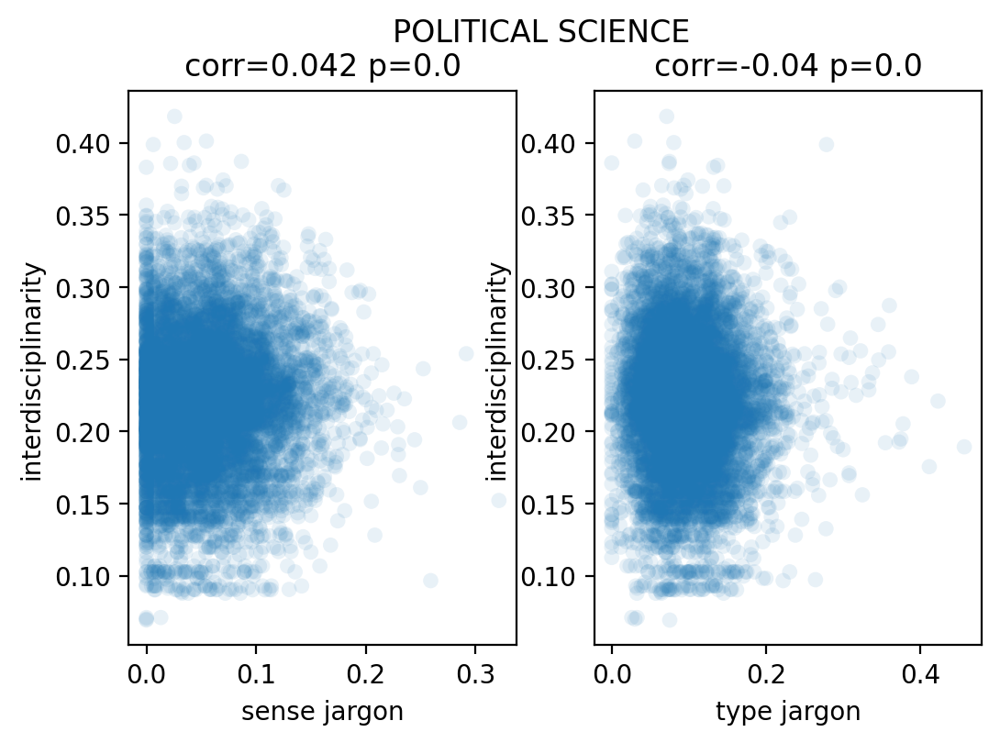

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.116
Model:                             OLS   Adj. R-squared:                  0.115
Method:                  Least Squares   F-statistic:                     123.2
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):          1.36e-218
Time:                         09:26:25   Log-Likelihood:                 14675.
No. Observations:                 8486   AIC:                        -2.933e+04
Df Residuals:                     8476   BIC:                        -2.926e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

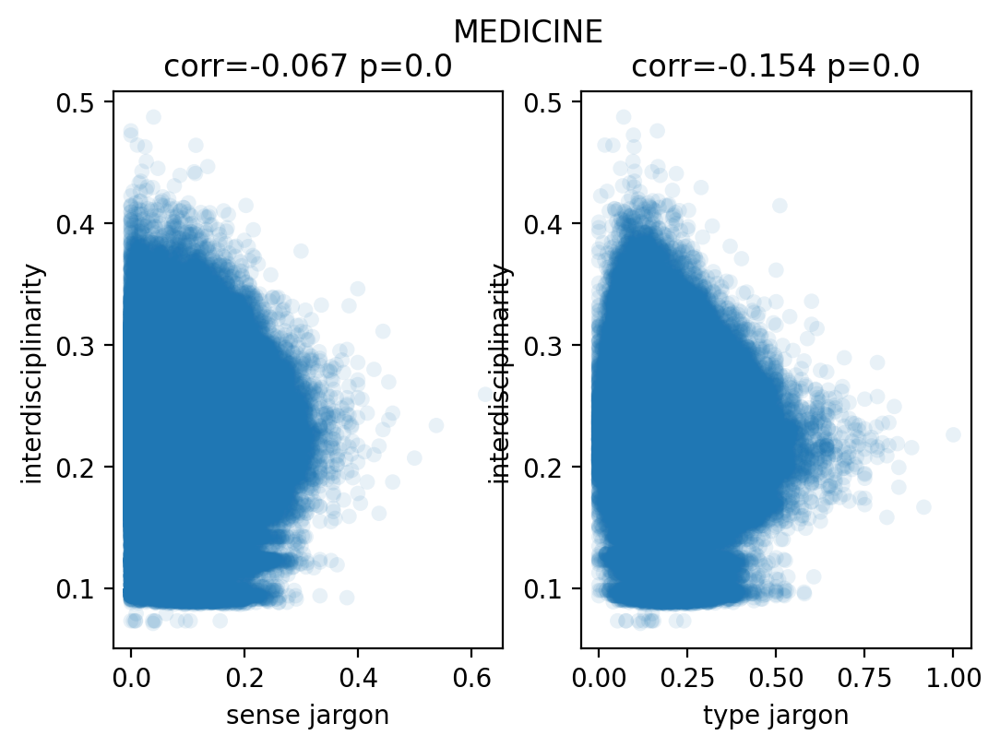

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.094
Model:                             OLS   Adj. R-squared:                  0.094
Method:                  Least Squares   F-statistic:                     6768.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:45   Log-Likelihood:             1.0818e+06
No. Observations:               589641   AIC:                        -2.164e+06
Df Residuals:                   589631   BIC:                        -2.163e+06
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

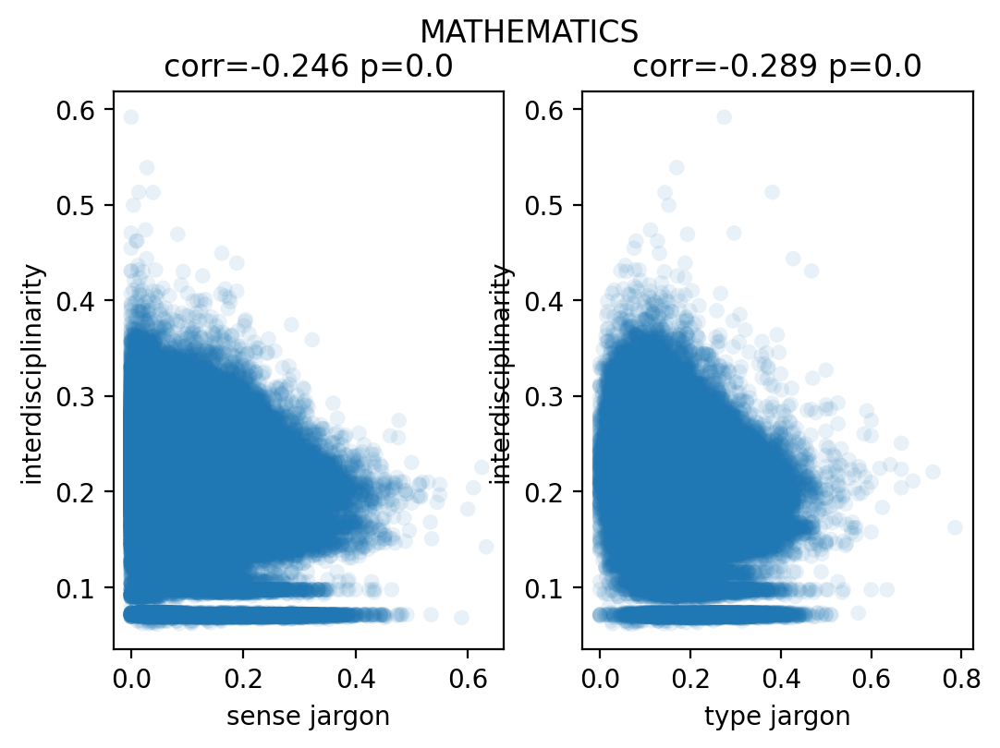

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.186
Model:                             OLS   Adj. R-squared:                  0.186
Method:                  Least Squares   F-statistic:                     3267.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:52   Log-Likelihood:             2.1250e+05
No. Observations:               128482   AIC:                        -4.250e+05
Df Residuals:                   128472   BIC:                        -4.249e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

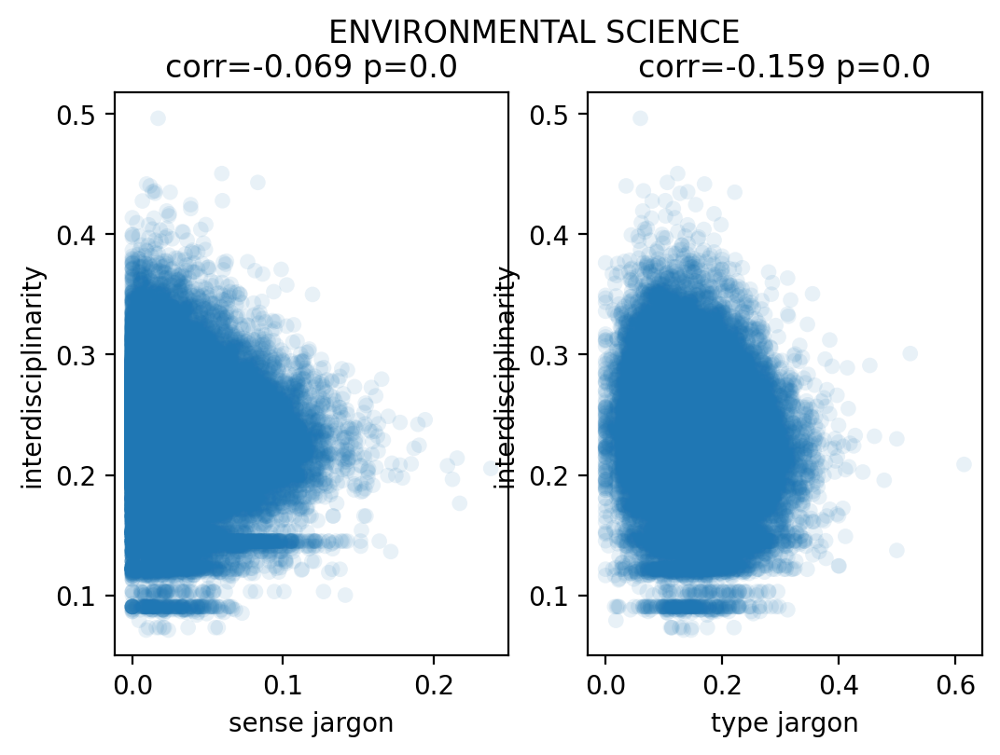

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.094
Model:                             OLS   Adj. R-squared:                  0.094
Method:                  Least Squares   F-statistic:                     566.7
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:54   Log-Likelihood:                 85021.
No. Observations:                49199   AIC:                        -1.700e+05
Df Residuals:                    49189   BIC:                        -1.699e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

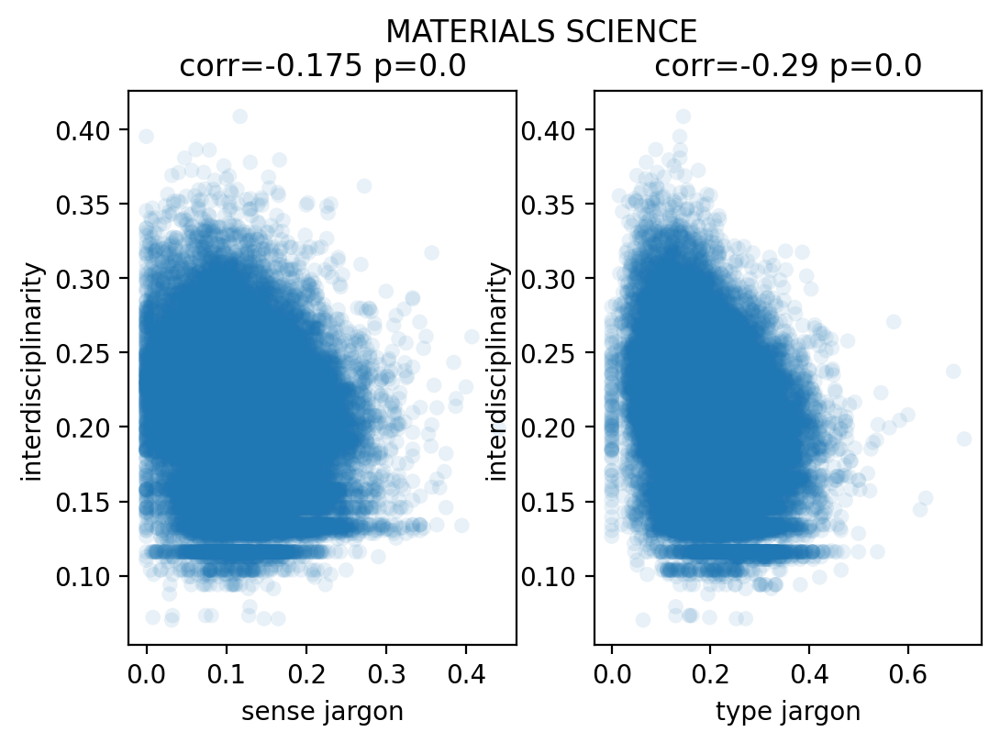

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.169
Model:                             OLS   Adj. R-squared:                  0.169
Method:                  Least Squares   F-statistic:                     1029.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:26:57   Log-Likelihood:                 84154.
No. Observations:                45445   AIC:                        -1.683e+05
Df Residuals:                    45435   BIC:                        -1.682e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

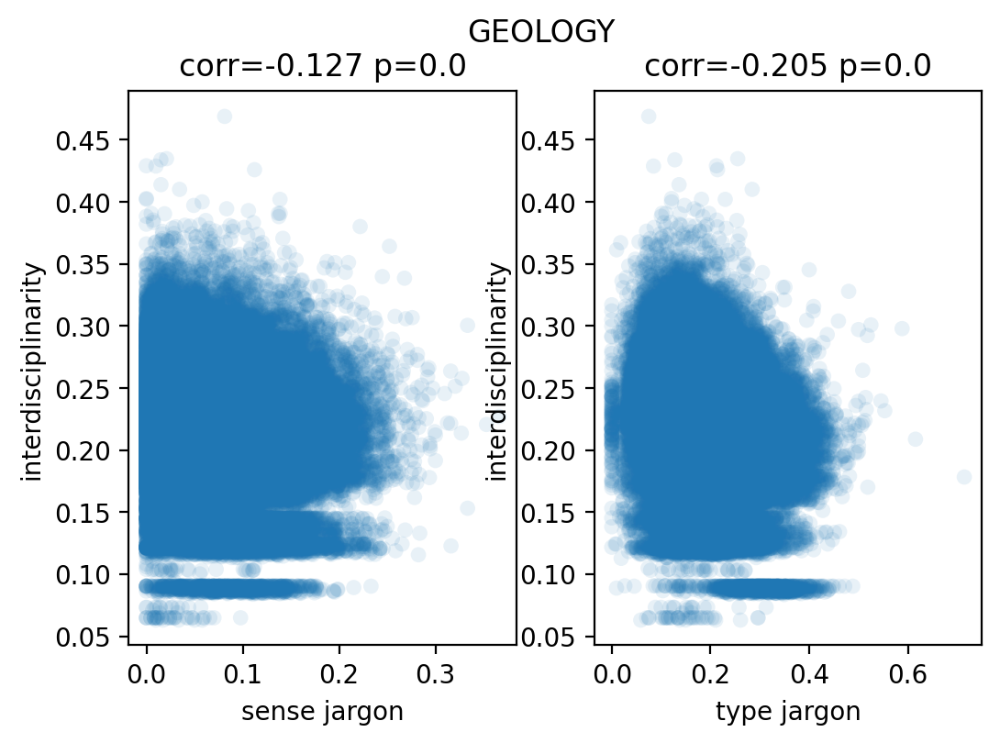

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.100
Model:                             OLS   Adj. R-squared:                  0.100
Method:                  Least Squares   F-statistic:                     1716.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:03   Log-Likelihood:             2.5672e+05
No. Observations:               138308   AIC:                        -5.134e+05
Df Residuals:                   138298   BIC:                        -5.133e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

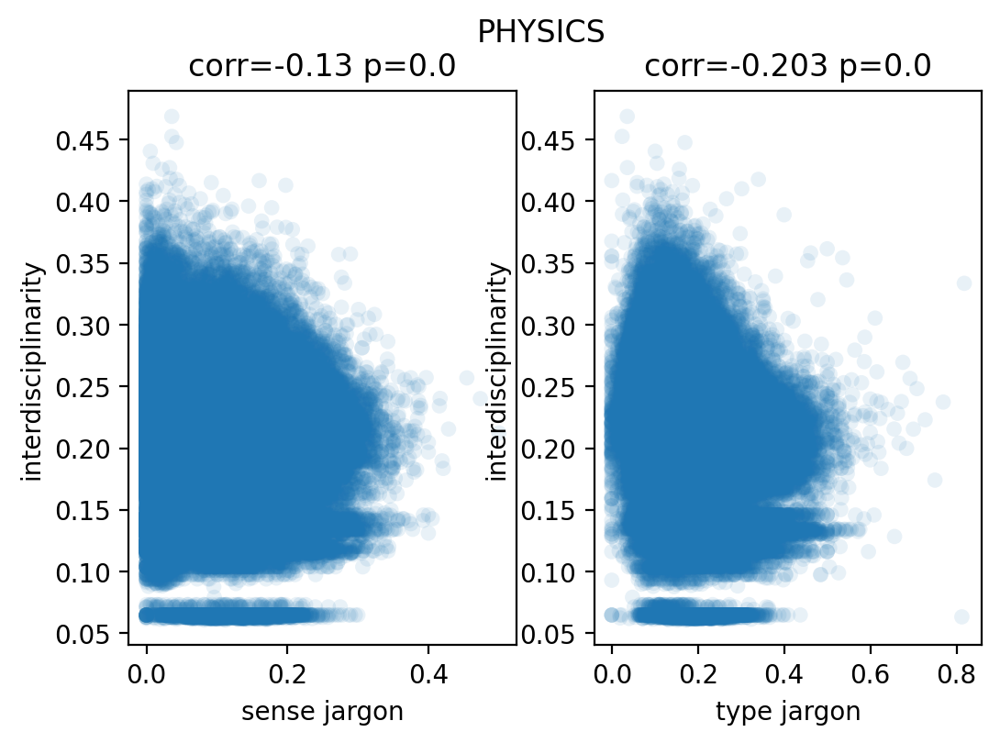

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.121
Model:                             OLS   Adj. R-squared:                  0.121
Method:                  Least Squares   F-statistic:                     3103.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:13   Log-Likelihood:             3.3977e+05
No. Observations:               203009   AIC:                        -6.795e+05
Df Residuals:                   202999   BIC:                        -6.794e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

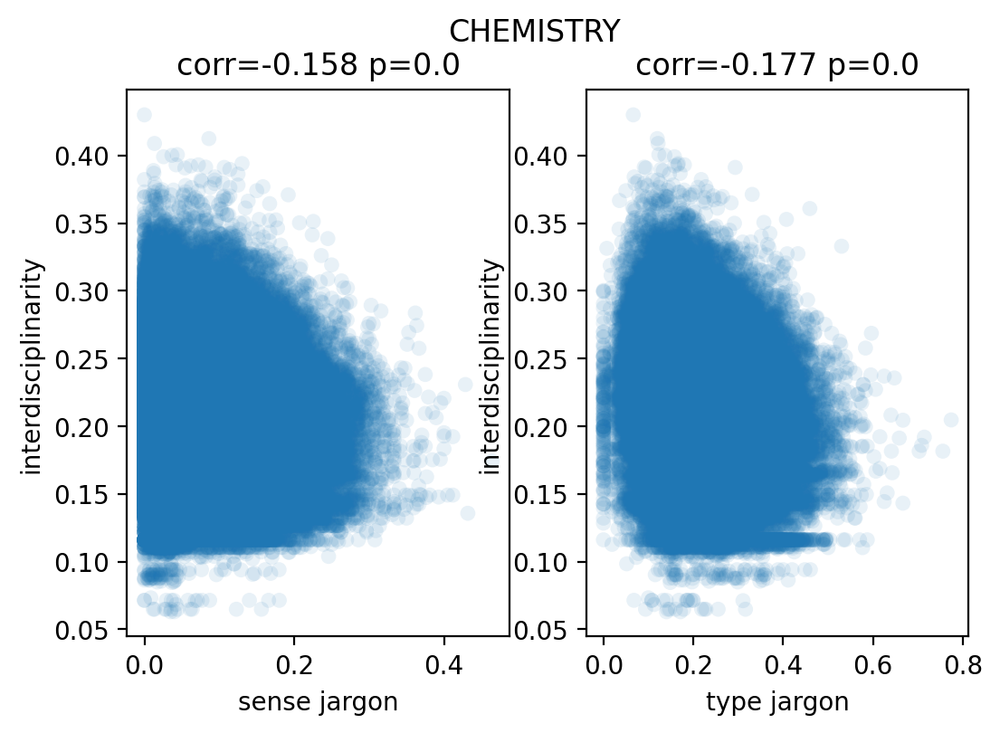

OLS results
                             OLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.127
Model:                             OLS   Adj. R-squared:                  0.127
Method:                  Least Squares   F-statistic:                     3045.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:22   Log-Likelihood:             3.5119e+05
No. Observations:               187621   AIC:                        -7.024e+05
Df Residuals:                   187611   BIC:                        -7.023e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [39]:
# separate out analysis by level 0 FOS
for fos in papers_to_regress: 
    print("###########################")
    print("-------", fos.upper(), "-------")
    print("###########################")
    fos_papers = set()
    num_fields = Counter()
    for paper_d in papers_to_regress[fos]: 
        fos_papers.add(paper_d['paper_id'])
        assert len(paper_d['level 1 fos']) == 1 or len(paper_d['level 1 fos']) == 2
        num_fields[paper_d['paper_id']] = len(paper_d['level 1 fos'])
    this_fos_df = interdisp_df[interdisp_df['paper id'].isin(fos_papers)].copy()
    # add in number of level 1 fields of study in that FOS
    this_fos_df['num fields'] = this_fos_df['paper id'].apply(lambda x: num_fields.get(x))
    
    this_fos_sense = sense_scores[fos]
    this_fos_df['sense jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_sense.get(x))
    this_fos_type = type_scores[fos]
    this_fos_df['type jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_type.get(x))
    this_fos_df = this_fos_df.dropna()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, dpi=200)
    fig.suptitle(fos.upper())
    r, p = scipy.stats.pearsonr(x=this_fos_df['sense jargon'], y=this_fos_df['interdisciplinarity'])
    sns.scatterplot(x='sense jargon', y='interdisciplinarity', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax1)
    ax1.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    r, p = scipy.stats.pearsonr(x=this_fos_df['type jargon'], y=this_fos_df['interdisciplinarity'])
    sns.scatterplot(x='type jargon', y='interdisciplinarity', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax2)
    ax2.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    plt.show()
    
    cols_with_no_space = {}
    for col in this_fos_df.columns: 
        cols_with_no_space[col] = col.replace(" ", "_")
    this_fos_df = this_fos_df.rename(columns=cols_with_no_space)
    
    yr = [0, 1, 2]
    nf = [1, 2]
    expr = """interdisciplinarity ~ C(year_bin,levels=yr) + abstract_length + journal_avg_cite + log_num_authors + log_num_refs + C(num_fields,levels=nf) + sense_jargon + type_jargon"""
    
    y, X = dmatrices(expr, this_fos_df, return_type='dataframe')
    ols_results = sm.OLS(y, X).fit()
    
    print("OLS results")
    print(ols_results.summary())
    print("Bonferroni corrected p-vals (-1, -2):", ols_results.pvalues[-1]*76, ols_results.pvalues[-2]*76)
    
    run_diagnostics = False
    if run_diagnostics: 
        # run diagnostics
        cls = Linear_Reg_Diagnostic(ols_results)

        # Linear Unbiased Estimator 

        # 1. linearity in parameters, want to see horizontal red line
        # 3. zero conditional mean of error, line is around zero
        fig, ax = plt.subplots(ncols=1, figsize=(5,5))
        cls.residual_plot(ax=ax)
        plt.show()

        # 2. no perfect collinearity among covariates (vif table)
        # VIF > 5 means highly collinear
        cls.vif_table()

        # Best Linear Unbiased Estimator

        # 4. homoskedasticity, constant variance (scale location plot)
        # Breusch-Pagan test, p-value should be > 0.05
        names = ['Lagrange multiplier statistic', 'p-value',
            'f-value', 'f p-value']
        test = sms.het_breuschpagan(ols_results.resid, ols_results.model.exog)
        print(lzip(names, test))

        # 5. nonautocorrelation
        # look at Durbin-Watson, it should be a value near 2

        # if you also want reliable CI and p-values for coefs, 
        # and the estimator to align with the MLE:
        # 6. residuals are normally distributed Sapiro-Wilks test
        # p-value should be larger than 0.05
        print(shapiro(ols_results.resid))
        print("###########################")
        print("###########################")
        print("###########################")

In the above plots, it looks like we statisfy most assumptions except normality of residuals and homoskedasticity. Since we have nonautocorrelation we can also run a WLS and achieve similar coefficients. 

http://web.vu.lt/mif/a.buteikis/wp-content/uploads/2019/11/MultivariableRegression_4.pdf

https://www.statology.org/weighted-least-squares-in-python/

"defining the weights in such a way that the observations with lower variance are given more weight"

https://online.stat.psu.edu/stat462/node/186/

"Store the residuals and the fitted values from the ordinary least squares (OLS) regression.

Calculate the absolute values of the OLS residuals.

Regress the absolute values of the OLS residuals versus the OLS fitted values and store the fitted values from this regression. These fitted values are estimates of the error standard deviations.

Calculate weights equal to 1/fits2, where "fits" are the fitted values from the regression in the last step."

###########################
------- ART -------
###########################


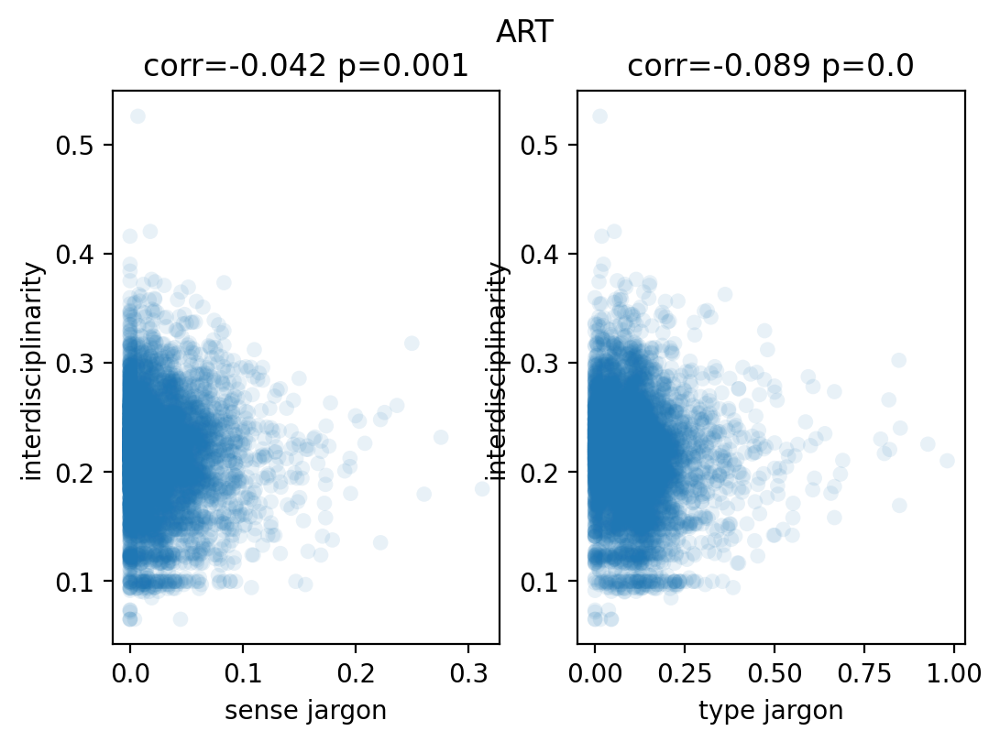

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.052
Model:                             WLS   Adj. R-squared:                  0.051
Method:                  Least Squares   F-statistic:                     35.49
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):           1.14e-61
Time:                         09:27:23   Log-Likelihood:                 9608.5
No. Observations:                 5826   AIC:                        -1.920e+04
Df Residuals:                     5816   BIC:                        -1.913e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

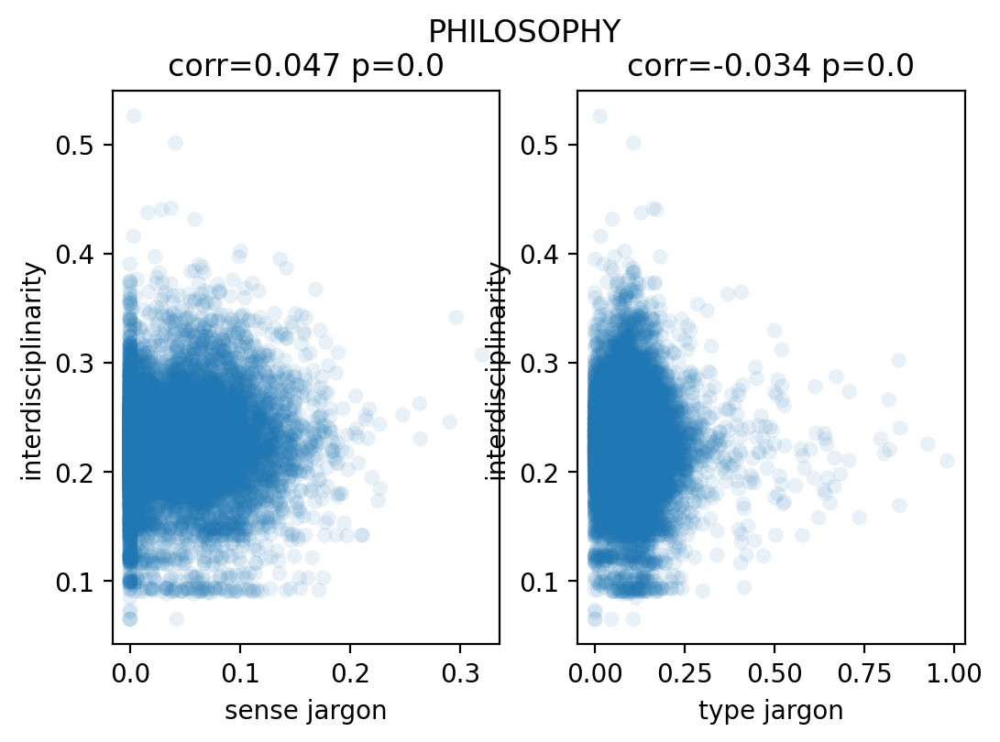

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.060
Model:                             WLS   Adj. R-squared:                  0.059
Method:                  Least Squares   F-statistic:                     74.30
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):          7.64e-134
Time:                         09:27:25   Log-Likelihood:                 18069.
No. Observations:                10559   AIC:                        -3.612e+04
Df Residuals:                    10549   BIC:                        -3.604e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

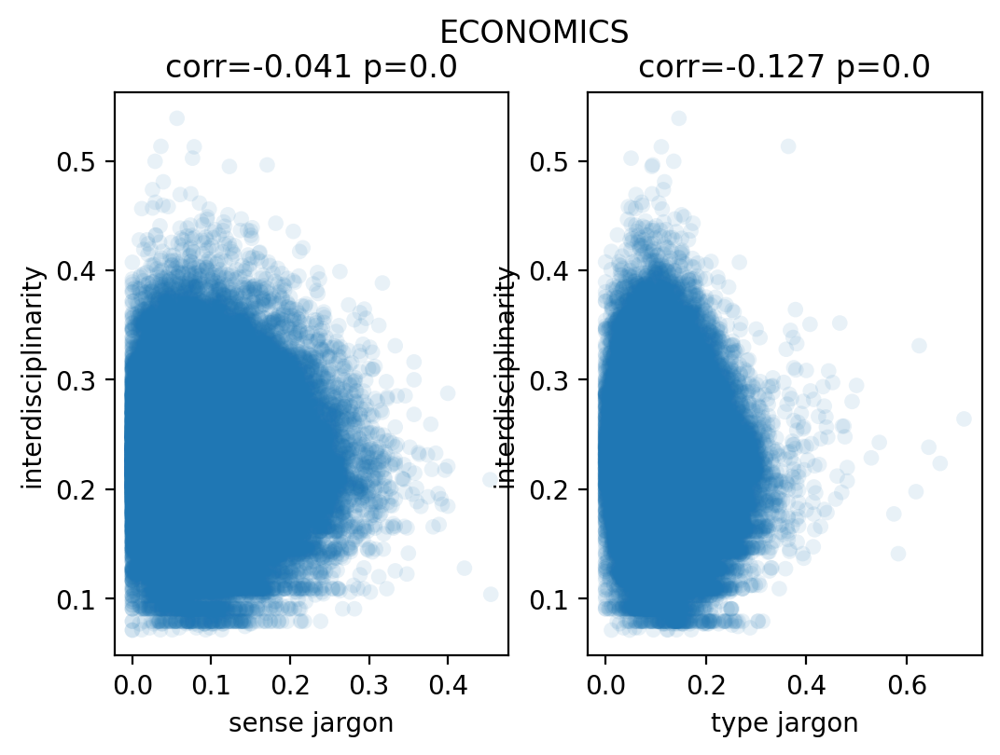

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.121
Model:                             WLS   Adj. R-squared:                  0.121
Method:                  Least Squares   F-statistic:                     1891.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:31   Log-Likelihood:             2.0624e+05
No. Observations:               123476   AIC:                        -4.125e+05
Df Residuals:                   123466   BIC:                        -4.124e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

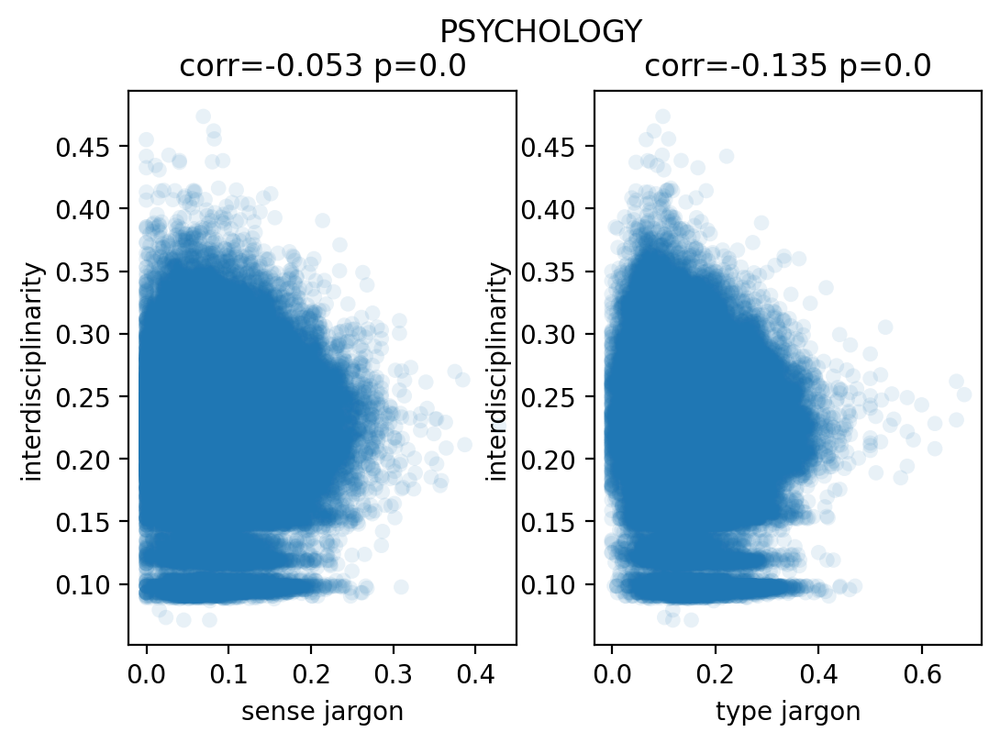

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.106
Model:                             WLS   Adj. R-squared:                  0.106
Method:                  Least Squares   F-statistic:                     1760.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:37   Log-Likelihood:             2.3150e+05
No. Observations:               133319   AIC:                        -4.630e+05
Df Residuals:                   133309   BIC:                        -4.629e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

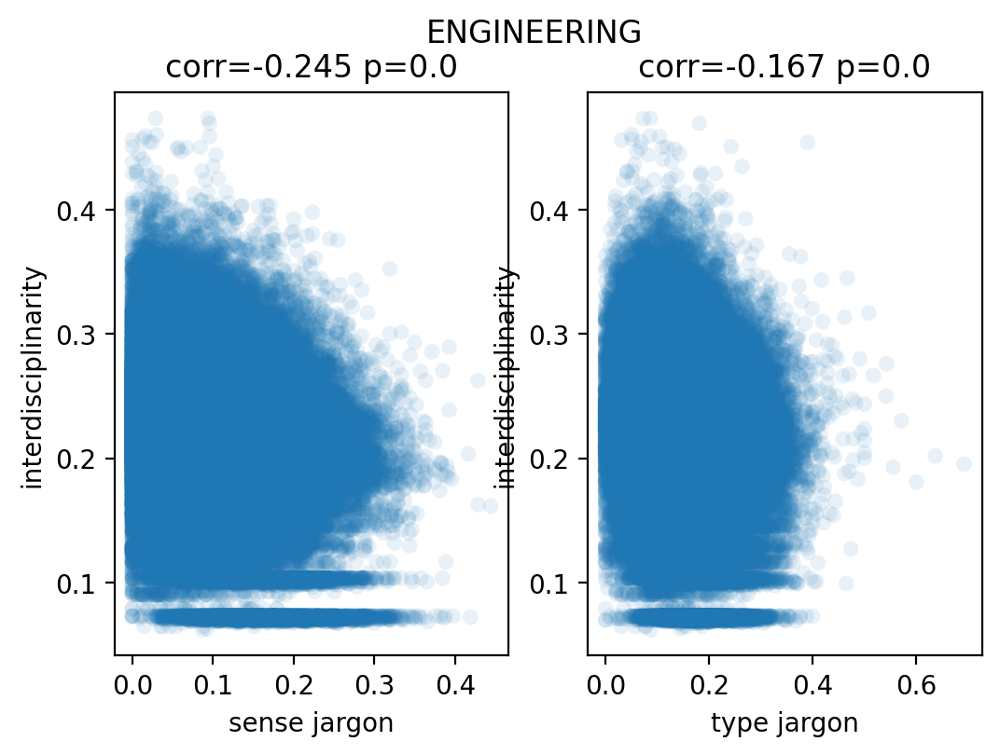

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.148
Model:                             WLS   Adj. R-squared:                  0.148
Method:                  Least Squares   F-statistic:                     3847.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:48   Log-Likelihood:             3.4227e+05
No. Observations:               199790   AIC:                        -6.845e+05
Df Residuals:                   199780   BIC:                        -6.844e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

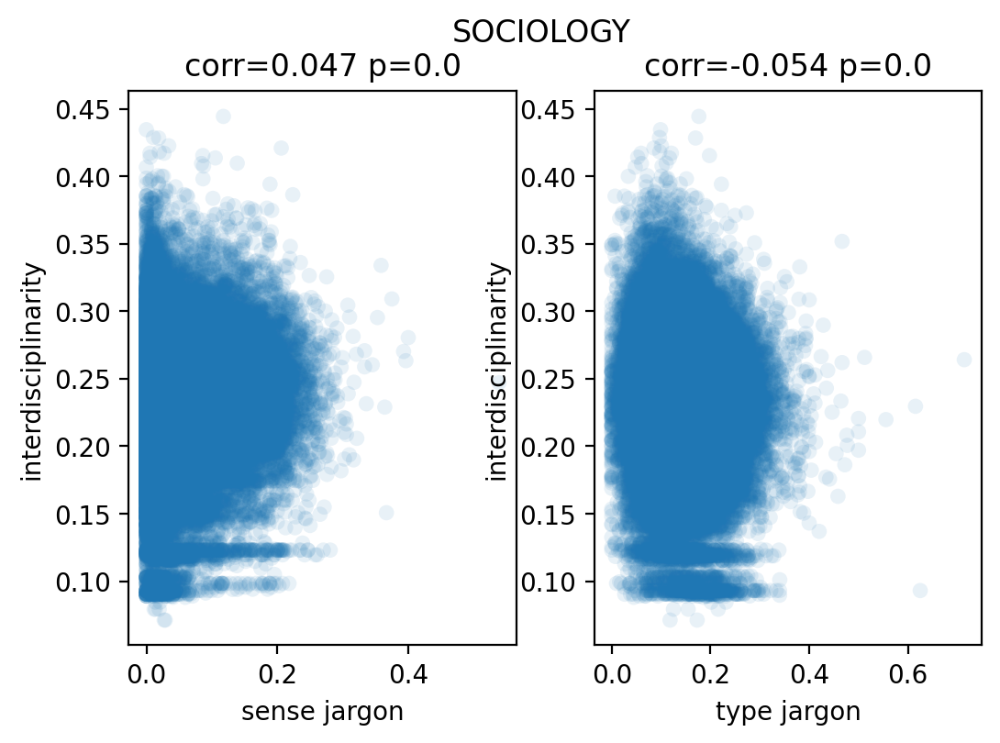

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.116
Model:                             WLS   Adj. R-squared:                  0.116
Method:                  Least Squares   F-statistic:                     818.9
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:51   Log-Likelihood:                 98549.
No. Observations:                56088   AIC:                        -1.971e+05
Df Residuals:                    56078   BIC:                        -1.970e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

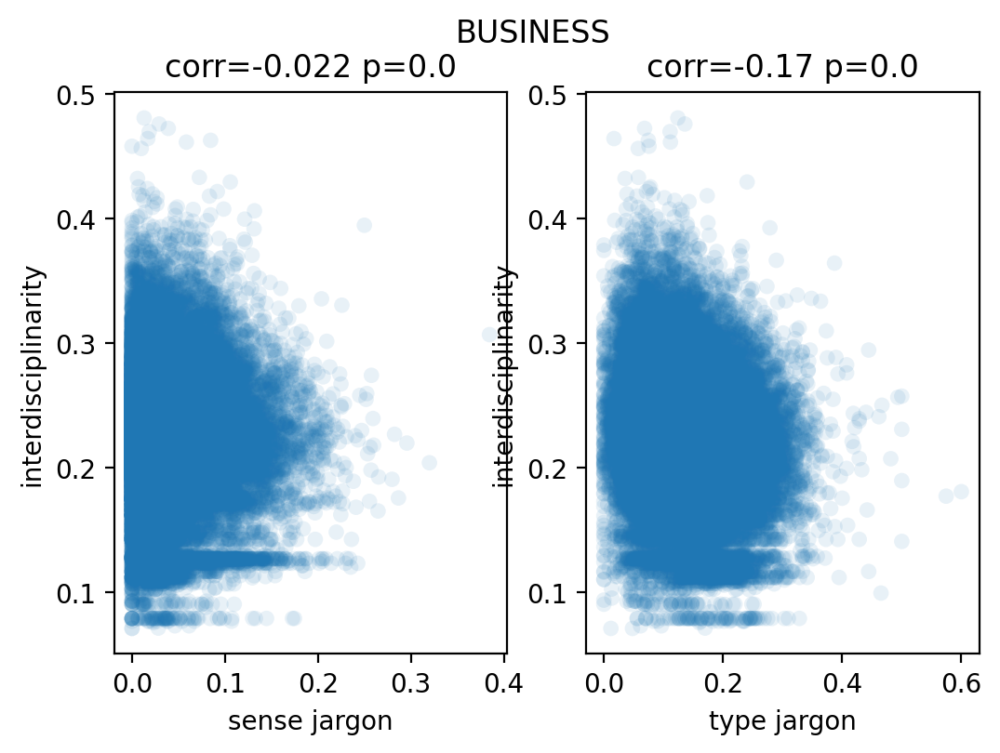

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.127
Model:                             WLS   Adj. R-squared:                  0.126
Method:                  Least Squares   F-statistic:                     637.2
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:27:54   Log-Likelihood:                 66379.
No. Observations:                39602   AIC:                        -1.327e+05
Df Residuals:                    39592   BIC:                        -1.327e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

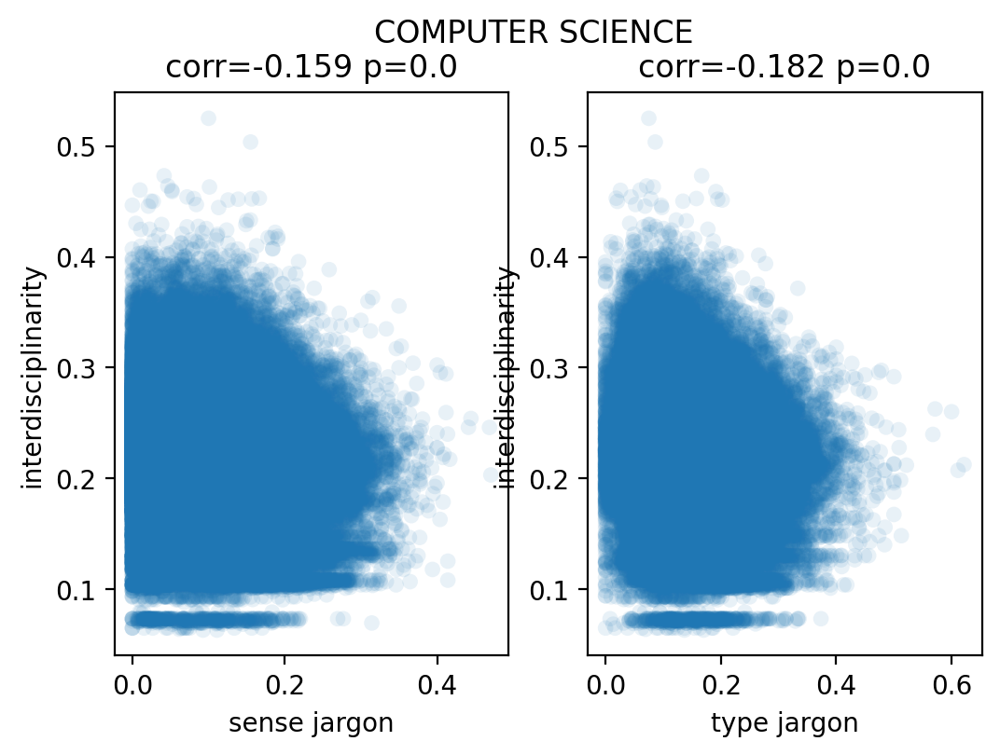

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.125
Model:                             WLS   Adj. R-squared:                  0.125
Method:                  Least Squares   F-statistic:                     3114.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:03   Log-Likelihood:             3.4020e+05
No. Observations:               196234   AIC:                        -6.804e+05
Df Residuals:                   196224   BIC:                        -6.803e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

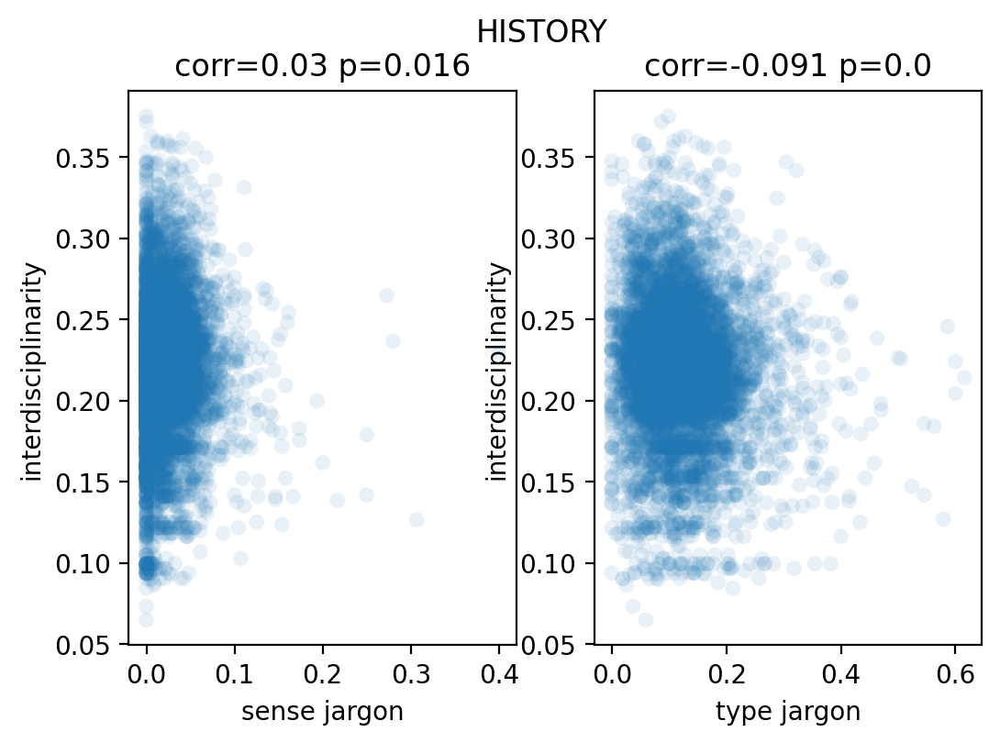

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.075
Model:                             WLS   Adj. R-squared:                  0.073
Method:                  Least Squares   F-statistic:                     58.20
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):          7.87e-103
Time:                         09:28:04   Log-Likelihood:                 11529.
No. Observations:                 6513   AIC:                        -2.304e+04
Df Residuals:                     6503   BIC:                        -2.297e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

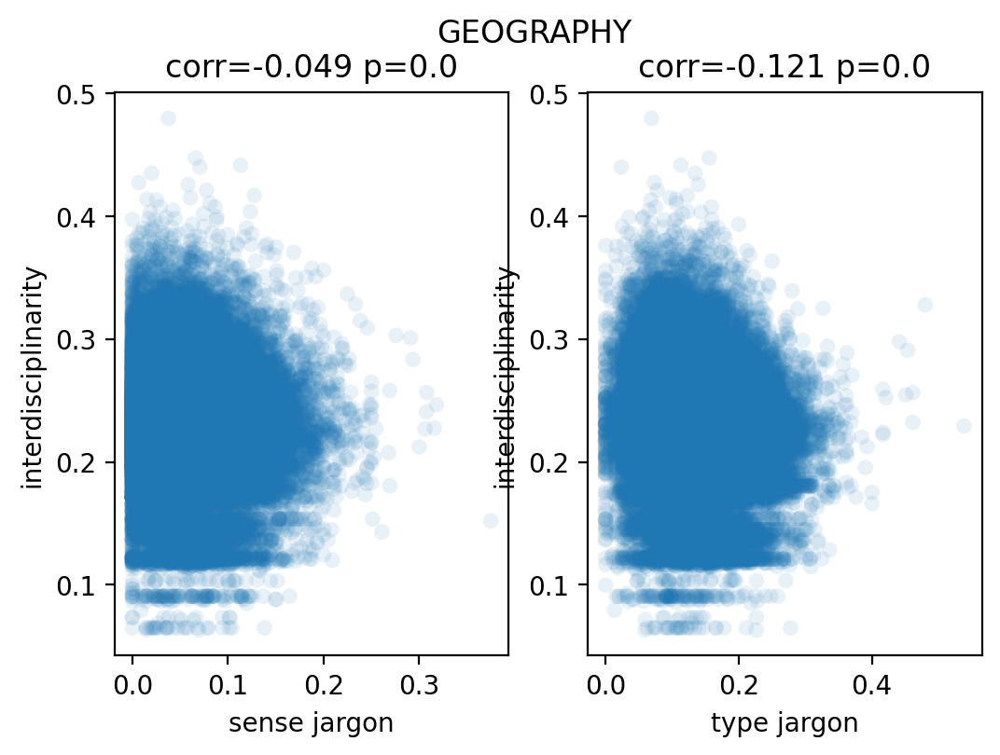

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.076
Model:                             WLS   Adj. R-squared:                  0.076
Method:                  Least Squares   F-statistic:                     469.6
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:07   Log-Likelihood:                 90236.
No. Observations:                51408   AIC:                        -1.805e+05
Df Residuals:                    51398   BIC:                        -1.804e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

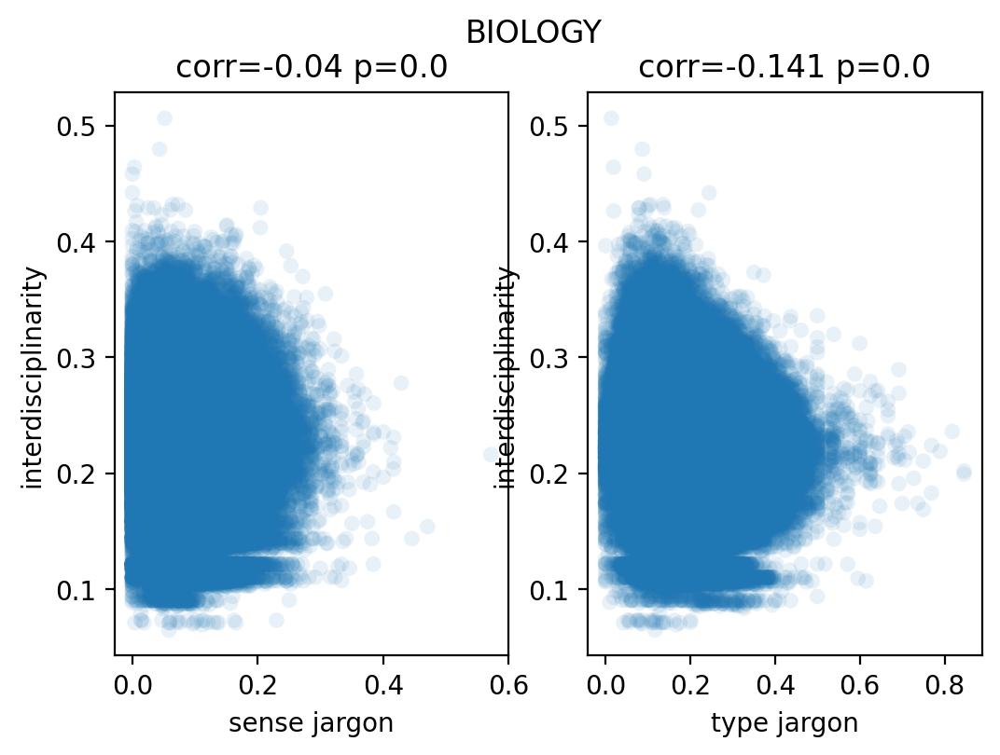

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.066
Model:                             WLS   Adj. R-squared:                  0.066
Method:                  Least Squares   F-statistic:                     3778.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:25   Log-Likelihood:             8.9451e+05
No. Observations:               481103   AIC:                        -1.789e+06
Df Residuals:                   481093   BIC:                        -1.789e+06
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

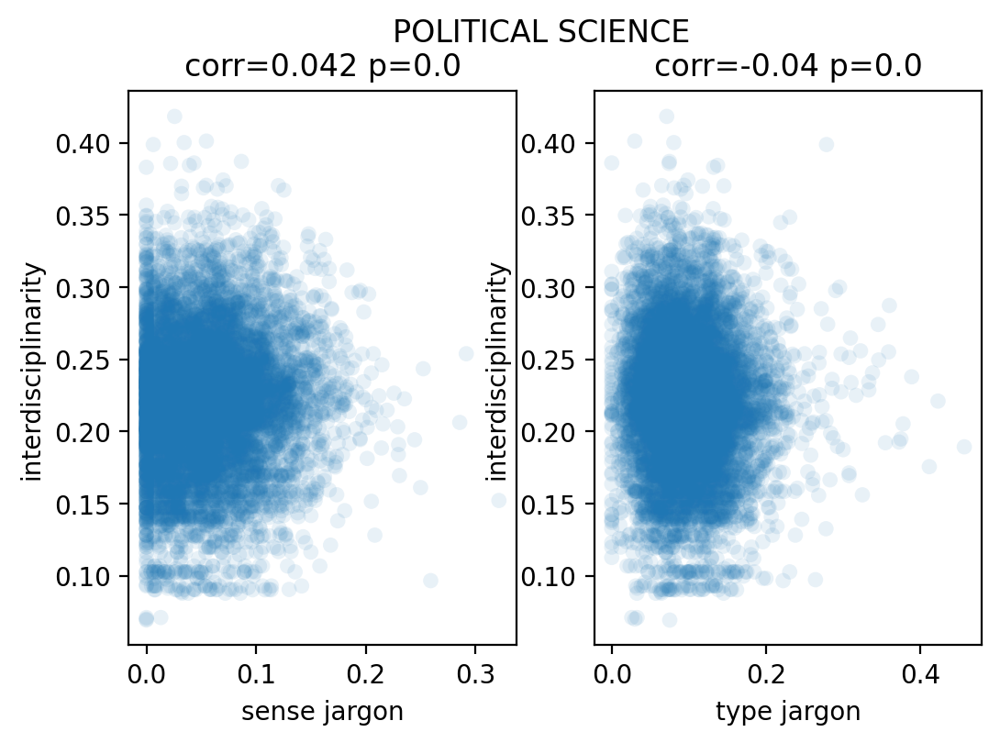

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.113
Model:                             WLS   Adj. R-squared:                  0.112
Method:                  Least Squares   F-statistic:                     119.6
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):          1.78e-212
Time:                         09:28:26   Log-Likelihood:                 14687.
No. Observations:                 8486   AIC:                        -2.935e+04
Df Residuals:                     8476   BIC:                        -2.928e+04
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

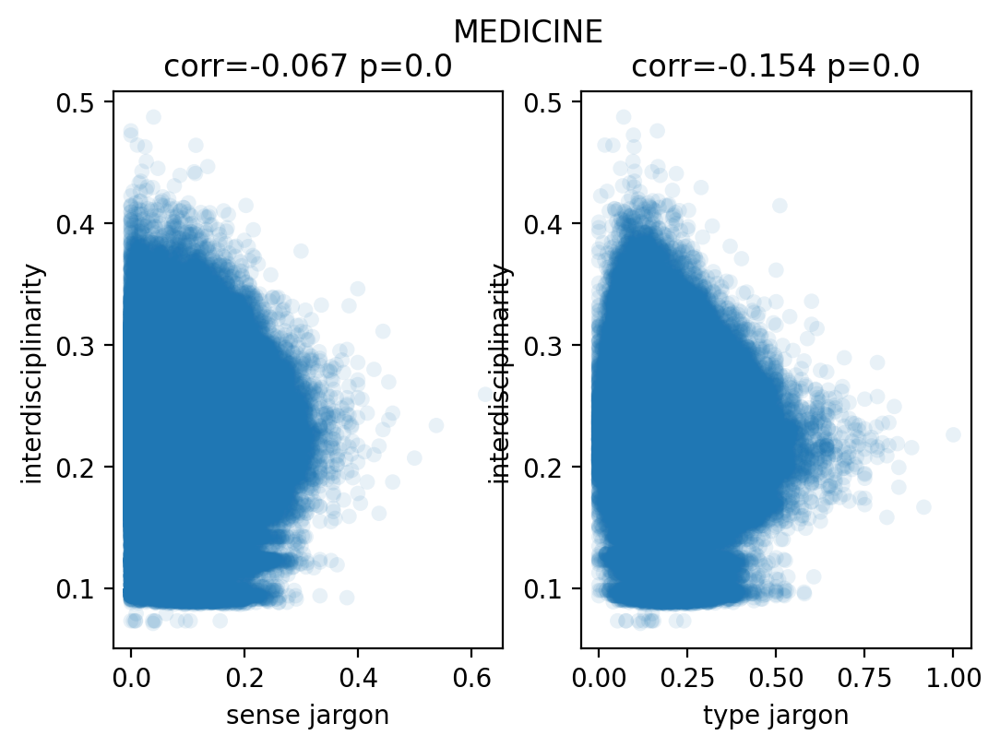

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.092
Model:                             WLS   Adj. R-squared:                  0.092
Method:                  Least Squares   F-statistic:                     6601.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:48   Log-Likelihood:             1.0830e+06
No. Observations:               589641   AIC:                        -2.166e+06
Df Residuals:                   589631   BIC:                        -2.166e+06
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

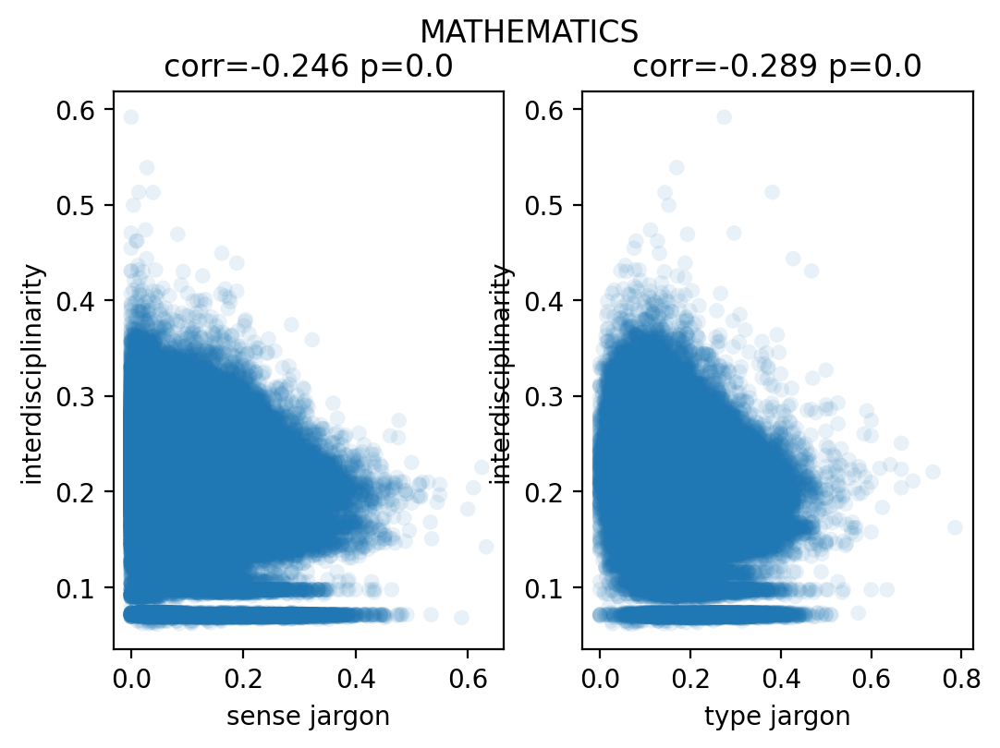

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.185
Model:                             WLS   Adj. R-squared:                  0.185
Method:                  Least Squares   F-statistic:                     3241.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:55   Log-Likelihood:             2.1260e+05
No. Observations:               128482   AIC:                        -4.252e+05
Df Residuals:                   128472   BIC:                        -4.251e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

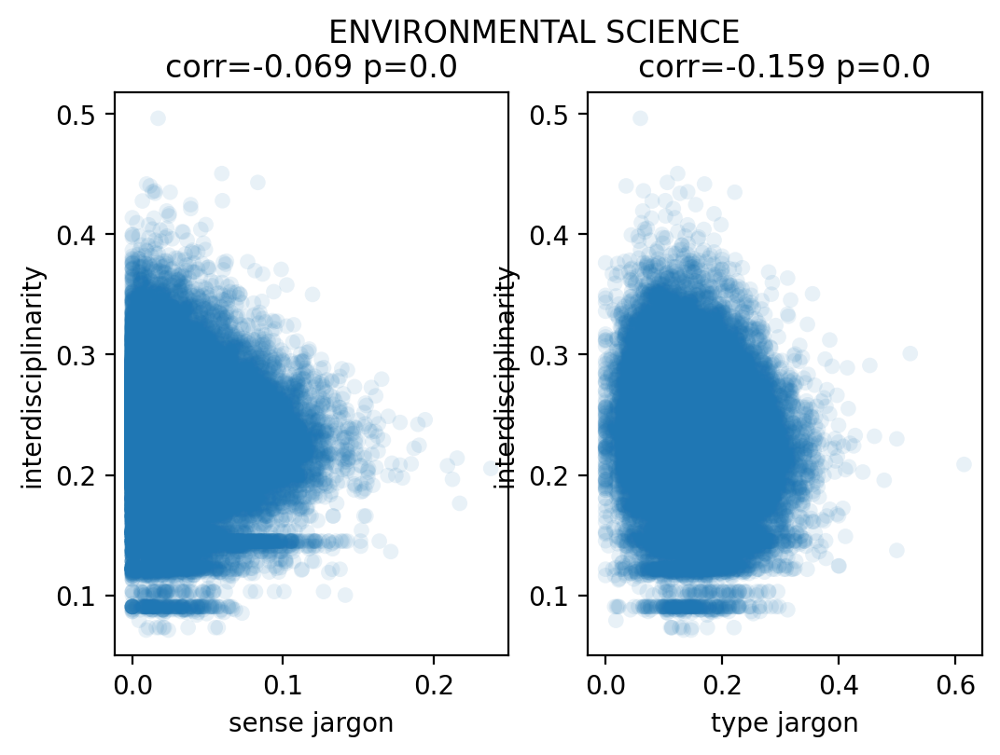

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.096
Model:                             WLS   Adj. R-squared:                  0.096
Method:                  Least Squares   F-statistic:                     578.2
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:28:58   Log-Likelihood:                 85155.
No. Observations:                49199   AIC:                        -1.703e+05
Df Residuals:                    49189   BIC:                        -1.702e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

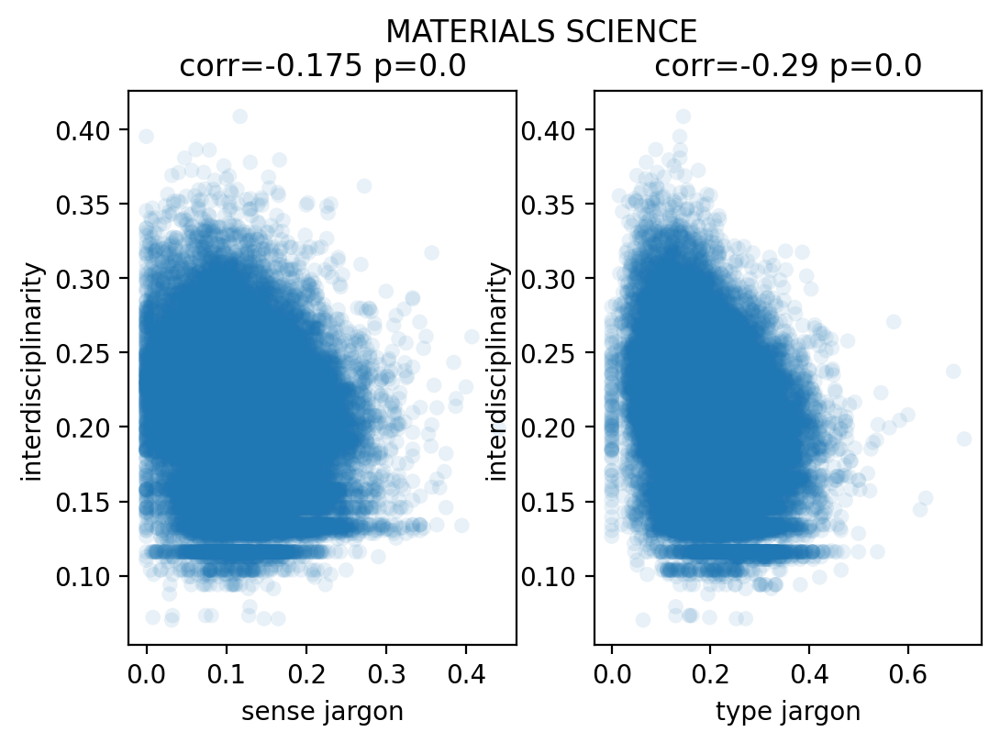

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.163
Model:                             WLS   Adj. R-squared:                  0.162
Method:                  Least Squares   F-statistic:                     980.5
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:29:01   Log-Likelihood:                 84277.
No. Observations:                45445   AIC:                        -1.685e+05
Df Residuals:                    45435   BIC:                        -1.684e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

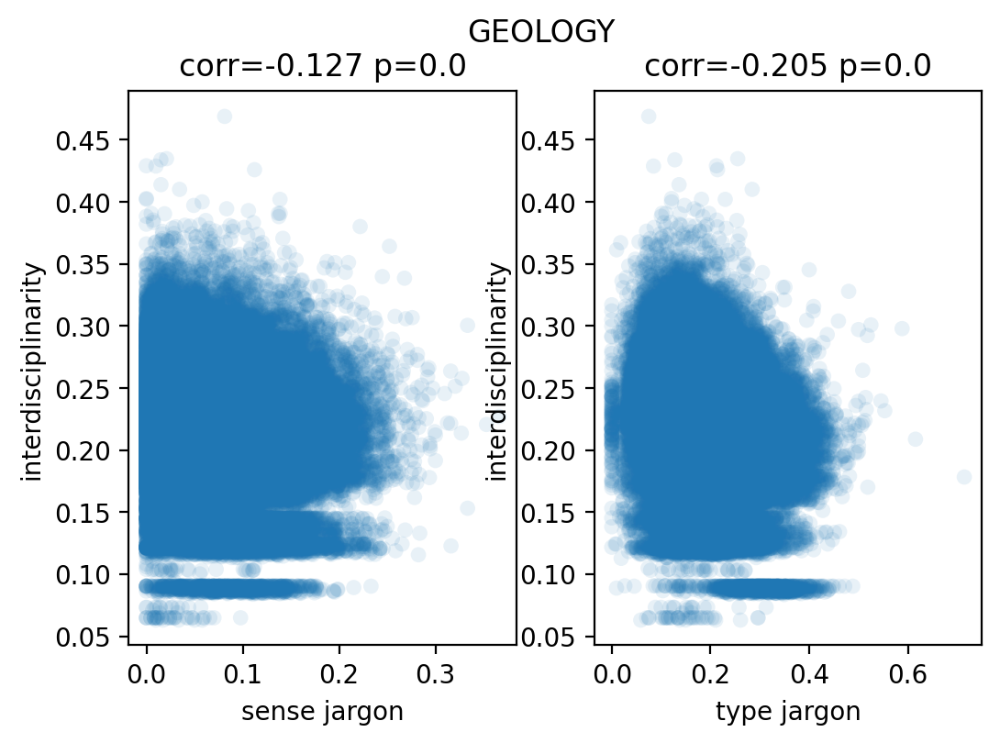

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.101
Model:                             WLS   Adj. R-squared:                  0.100
Method:                  Least Squares   F-statistic:                     1718.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:29:07   Log-Likelihood:             2.5672e+05
No. Observations:               138308   AIC:                        -5.134e+05
Df Residuals:                   138298   BIC:                        -5.133e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

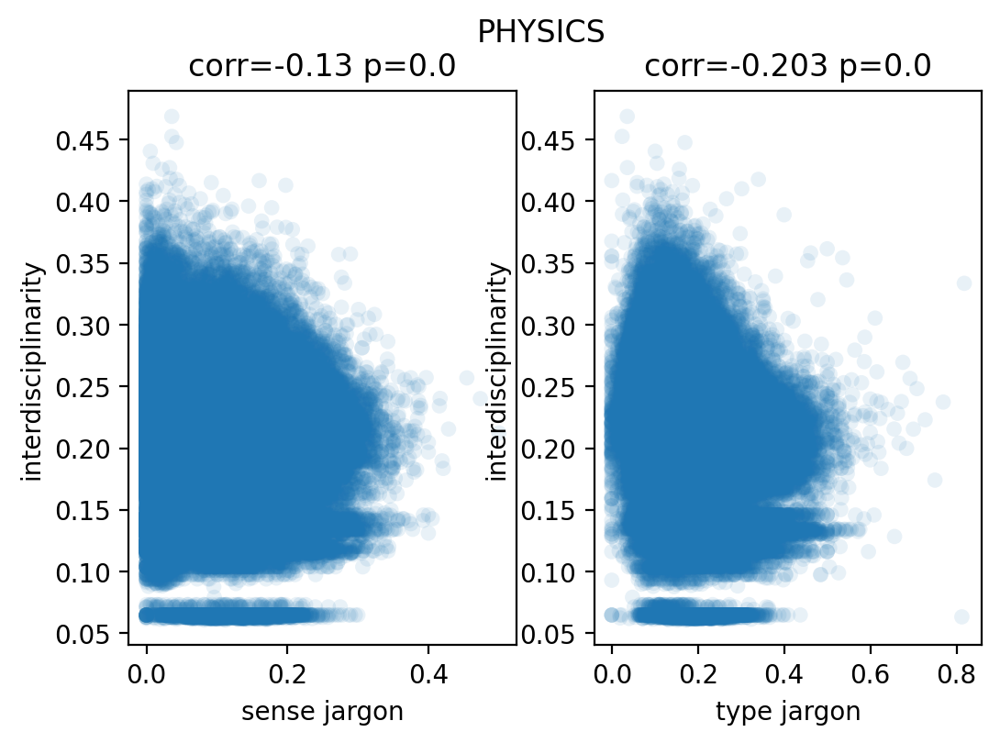

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.124
Model:                             WLS   Adj. R-squared:                  0.124
Method:                  Least Squares   F-statistic:                     3180.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:29:17   Log-Likelihood:             3.3977e+05
No. Observations:               203009   AIC:                        -6.795e+05
Df Residuals:                   202999   BIC:                        -6.794e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

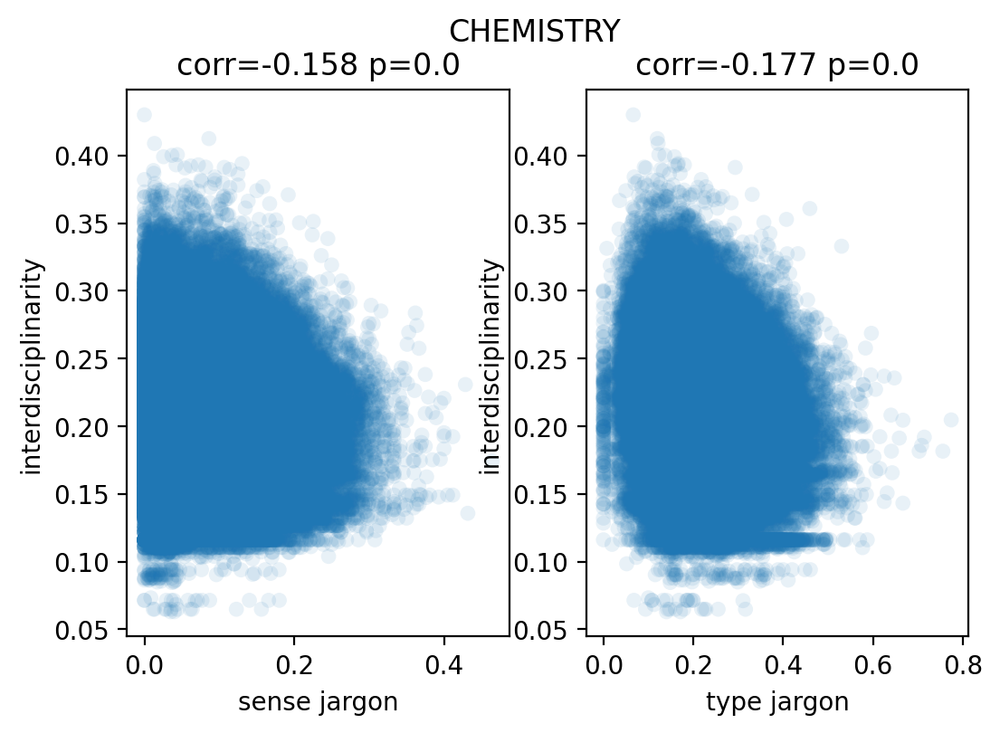

                             WLS Regression Results                            
Dep. Variable:     interdisciplinarity   R-squared:                       0.129
Model:                             WLS   Adj. R-squared:                  0.129
Method:                  Least Squares   F-statistic:                     3081.
Date:                 Mon, 05 Dec 2022   Prob (F-statistic):               0.00
Time:                         09:29:26   Log-Likelihood:             3.5163e+05
No. Observations:               187621   AIC:                        -7.032e+05
Df Residuals:                   187611   BIC:                        -7.031e+05
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Inte

In [40]:
# separate out analysis by level 0 FOS
for fos in papers_to_regress: 
    print("###########################")
    print("-------", fos.upper(), "-------")
    print("###########################")
    fos_papers = set()
    num_fields = Counter()
    for paper_d in papers_to_regress[fos]: 
        fos_papers.add(paper_d['paper_id'])
        assert len(paper_d['level 1 fos']) == 1 or len(paper_d['level 1 fos']) == 2
        num_fields[paper_d['paper_id']] = len(paper_d['level 1 fos'])
    this_fos_df = interdisp_df[interdisp_df['paper id'].isin(fos_papers)].copy()
    # add in number of level 1 fields of study in that FOS
    this_fos_df['num fields'] = this_fos_df['paper id'].apply(lambda x: num_fields.get(x))
    
    this_fos_sense = sense_scores[fos]
    this_fos_df['sense jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_sense.get(x))
    this_fos_type = type_scores[fos]
    this_fos_df['type jargon'] = this_fos_df['paper id'].apply(lambda x: this_fos_type.get(x))
    this_fos_df = this_fos_df.dropna()
    
    fig, (ax1, ax2) = plt.subplots(1, 2, dpi=200)
    fig.suptitle(fos.upper())
    r, p = scipy.stats.pearsonr(x=this_fos_df['sense jargon'], y=this_fos_df['interdisciplinarity'])
    sns.scatterplot(x='sense jargon', y='interdisciplinarity', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax1)
    ax1.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    r, p = scipy.stats.pearsonr(x=this_fos_df['type jargon'], y=this_fos_df['interdisciplinarity'])
    sns.scatterplot(x='type jargon', y='interdisciplinarity', 
                data=this_fos_df, alpha=0.1, 
               edgecolor="none", ax=ax2)
    ax2.set_title("corr=" + str(round(r, 3)) + " p=" + str(round(p, 3)))
    plt.show()
    
    cols_with_no_space = {}
    for col in this_fos_df.columns: 
        cols_with_no_space[col] = col.replace(" ", "_")
    this_fos_df = this_fos_df.rename(columns=cols_with_no_space)
    
    yr = [0, 1, 2]
    nf = [1, 2]
    expr = """interdisciplinarity ~ C(year_bin,levels=yr) + abstract_length + journal_avg_cite + log_num_authors + log_num_refs + C(num_fields,levels=nf) + sense_jargon + type_jargon"""
    
    model_ols = smf.ols(expr, data=this_fos_df).fit() 
    
    y, X = dmatrices(expr, this_fos_df, return_type='dataframe')
    
    model_fitted_y = model_ols.fittedvalues
    model_abs_resid = np.abs(model_ols.resid)
    this_fos_df["temp"] = model_abs_resid 
    this_fos_df["fitted"] = model_fitted_y 
    model_temp = smf.ols("temp ~ fitted", data=this_fos_df).fit() 
    weight = model_temp.fittedvalues 
    weight = weight**-2 

    model_wls_1 = sm.WLS(y, X, weights=weight) 
    mod_res_1 = model_wls_1.fit() 
    print(mod_res_1.summary())
    print("###########################")
    print("###########################")